Cyna Shirazinejad, 12/27/21

# Notebook 19: compare shock conditions

outline:

* compare the following attributes:
* * principal component distributions
* * maximum intensities
* * lifetimes
* * initiation rates of events

##### import all necessary Python modules

In [1]:
%load_ext autoreload
%autoreload 2
import sys
import pandas as pd
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt
import random
import matplotlib as mpl
from skimage import feature, exposure, io
from skimage.color import rgb2gray
from skimage.filters import median
from skimage.morphology import disk
import imagecodecs
from IPython.display import Image
import matplotlib.patches as patches
from scipy import stats
import imageio
import itertools
import seaborn as sns
from tqdm import tqdm
import sklearn.preprocessing as preprocessing
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.mixture import GaussianMixture as GMM
%matplotlib inline
unique_user_path_notebook = str(np.load('unique_user_path_notebook.npy'))
unique_user_saved_outputs = str(np.load('unique_user_saved_outputs.npy'))
unique_user_path_tracks = str(np.load('unique_user_path_tracks.npy'))
sys.path.append(unique_user_path_notebook+'/cmeAnalysisPostProcessingPythonScripts') # add custom Python scripts to the local path
import display_tracks
import merge_tools
import generate_index_dictionary
import return_track_attributes
index_dictionary = generate_index_dictionary.return_index_dictionary()

# load dataframe from notebook 6 containing normal-pdf scaled features: PC's and GMM predicted clusters, and dataframe with cmeAnalysis labels

In [3]:
df_pcs_normal_scaled_with_gmm_cluster = pd.read_csv(unique_user_saved_outputs+'/dataframes/df_new_incorporated_data_pcs_gmm_clusters_including_shock.zip')
df_merged_features = pd.read_csv(unique_user_saved_outputs+'/dataframes/df_new_incorporated_data_merged_features_including_shock.zip')
feature_units = np.load(unique_user_saved_outputs+'/dataframes/feature_units.npy')
index_DNM2positive = np.load(unique_user_saved_outputs+'/dataframes/cluster_dnm2_positive.npy')
number_of_track_splits = np.load(unique_user_saved_outputs+'/dataframes/number_of_track_splits.npy')
number_of_clusters = np.load(unique_user_saved_outputs+"/dataframes/number_of_clusters.npy")
ccp_predictions = np.load(unique_user_saved_outputs+'/dataframes/merged_ccp_predictions_including_shock.npy')

In [4]:
df_merged_features

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,kurtosis_dnm2,number_significant_dnm2,max_consecutive_significant_dnm2,fraction_significant_dnm2,fraction_peak_ap2,fraction_peak_dnm2,experiment_number,number_of_channels,date,cmeAnalysis_dynamin2_prediction
0,216.0,1796.284550,740.516756,7.203812,7.203812,2.630656,0.566262,0.725913,159.0,186.0,...,0.889904,167.0,43.0,0.738938,0.703540,0.823009,0.0,2.0,200804.0,1.0
1,201.0,2215.532695,1505.433273,17.220726,14.507135,3.797526,0.424574,0.912671,111.0,107.0,...,8.009901,115.0,89.0,0.545024,0.526066,0.507109,0.0,2.0,200804.0,1.0
2,201.0,864.976087,421.405691,17.621866,17.130473,3.472332,0.566588,0.776404,42.0,44.0,...,0.807456,167.0,70.0,0.791469,0.199052,0.208531,0.0,2.0,200804.0,1.0
3,192.0,509.795166,356.302521,10.804211,13.292842,5.888569,0.428736,1.058177,44.0,190.0,...,4.081995,112.0,57.0,0.554455,0.217822,0.940594,0.0,2.0,200804.0,1.0
4,188.0,1636.422386,883.606436,11.255090,7.793074,5.531006,0.415792,0.753372,174.0,169.0,...,2.885473,169.0,80.0,0.853535,0.878788,0.853535,0.0,2.0,200804.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
242502,2.0,28.054860,16.586818,2.083531,5.014688,4.483773,1.413195,2.791558,5.0,8.0,...,0.754018,0.0,0.0,0.000000,0.416667,0.666667,30.0,5.0,211227.0,0.0
242503,2.0,50.579412,8.441034,6.683116,2.285077,4.231456,1.775796,0.675348,5.0,1.0,...,0.441304,0.0,0.0,0.000000,0.416667,0.083333,30.0,5.0,211227.0,0.0
242504,2.0,46.818641,-1.983774,1.533790,2.409278,3.660411,1.399023,1.953524,6.0,4.0,...,-1.230884,0.0,0.0,0.000000,0.500000,0.333333,30.0,5.0,211227.0,0.0
242505,2.0,65.550032,6.285178,1.108563,0.463661,2.970810,1.573254,0.092735,6.0,11.0,...,-0.548510,0.0,0.0,0.000000,0.500000,0.916667,30.0,5.0,211227.0,0.0


# load all valid tracks

In [6]:
merged_all_valid_tracks = np.load(unique_user_saved_outputs+'/dataframes/all_experiments_merged_all_valid_tracks_including_shock0.npy', allow_pickle=True)

for i in range(1,number_of_track_splits):

    merged_all_valid_tracks = np.concatenate((merged_all_valid_tracks,
                                             np.load(unique_user_saved_outputs+'/dataframes/all_experiments_merged_all_valid_tracks_including_shock'+str(i)+'.npy', allow_pickle=True)))

In [7]:
len(merged_all_valid_tracks)

242507

# upload hotspot predictions

In [8]:
# array of CCO predictions of DNM2 positive GMM class; 1: single CCP, 0: hot-spot/non-peaked DNM2 event
indices_ccp = list(np.where(np.array(ccp_predictions)==1)[0])
feature_units = np.load(unique_user_saved_outputs+'/dataframes/feature_units.npy')

# compare contributions to principal components from separate experiments used to generate model (2 color cell line)

In [9]:
# # %%capture
# fig, axes = plt.subplots(1,2, figsize=(7,3), dpi=500)
# for exp_number in range(len(set(df_merged_features['experiment_number']))):
    
#     df = df_merged_features
    
#     if exp_number<8:
        
#         indices_exp = df[df['experiment_number']==exp_number].index.values

#         pc0_exp = df_pcs_normal_scaled_with_gmm_cluster.values[:,0][indices_exp]
#         pc1_exp = df_pcs_normal_scaled_with_gmm_cluster.values[:,1][indices_exp]

#         axes[0].hist(pc0_exp, cumulative=True, histtype='step', bins='auto', label='experiment ' + str(exp_number), density=True)
#         axes[1].hist(pc1_exp, cumulative=True, histtype='step', bins='auto', label='experiment ' + str(exp_number), density=True)

# axes[0].set_xlabel('PC-0')
# axes[1].set_xlabel('PC-1')
# axes[0].set_ylabel('cumulative frequency')
# axes[1].set_ylabel('cumulative frequency')
# plt.tight_layout()
# # plt.savefig(unique_user_saved_outputs+'/plots/pc01_trainingdata_nb7.png', bbox_inches='tight')

In [10]:
# Image(filename=unique_user_saved_outputs+'/plots/pc01_trainingdata_nb7.png', height=500, width=500)

# compare contributions to principal components from separate experiments in ARPC3-tagged cell line

In [11]:
# %%capture
# fig, axes = plt.subplots(1,2, figsize=(7,3), dpi=500)
# for exp_number in range(len(set(df_merged_features['experiment_number']))):
    
#     df = df_merged_features
    
#     if exp_number>=8:
        
#         indices_exp = df[df['experiment_number']==exp_number].index.values

#         pc0_exp = df_pcs_normal_scaled_with_gmm_cluster.values[:,0][indices_exp]
#         pc1_exp = df_pcs_normal_scaled_with_gmm_cluster.values[:,1][indices_exp]

#         axes[0].hist(pc0_exp, cumulative=True, histtype='step', bins='auto', label='experiment ' + str(exp_number), density=True)
#         axes[1].hist(pc1_exp, cumulative=True, histtype='step', bins='auto', label='experiment ' + str(exp_number), density=True)

# axes[0].set_xlabel('PC-0')
# axes[1].set_xlabel('PC-1')
# axes[0].set_ylabel('cumulative frequency')
# axes[1].set_ylabel('cumulative frequency')
# plt.tight_layout()
# plt.savefig(unique_user_saved_outputs+'/plots/pc01_inferencearpc3linedata_nb7.png', bbox_inches='tight')

In [14]:
# Image(filename=unique_user_saved_outputs+'/plots/pc01_inferencearpc3linedata_nb7.png', height=500, width=500)

# compare contributions to principal components from separate imaging dates

In [12]:
# %%capture
# fig, axes = plt.subplots(1,2, figsize=(7,3), dpi=500)
# for date in set(df_merged_features['date']):
    
#     df = df_merged_features
    
#     indices = df[df['date']==date].index.values

#     pc0 = df_pcs_normal_scaled_with_gmm_cluster.values[:,0][indices]
#     pc1 = df_pcs_normal_scaled_with_gmm_cluster.values[:,1][indices]

#     axes[0].hist(pc0, cumulative=True, histtype='step', bins='auto', density=True, alpha=0.5, label=date)
#     axes[1].hist(pc1, cumulative=True, histtype='step', bins='auto', density=True, alpha=0.5, label=date)

# axes[0].set_xlabel('PC-0')
# axes[1].set_xlabel('PC-1')
# axes[0].set_ylabel('cumulative frequency')
# axes[1].set_ylabel('cumulative frequency')
# plt.legend(loc='upper left')
# plt.tight_layout()
# plt.savefig(unique_user_saved_outputs+'/plots/pc01_imagingdates.png', bbox_inches='tight')

In [13]:
# Image(filename=unique_user_saved_outputs+'/plots/pc01_imagingdates.png', height=500, width=500)

# compare contributions to principal components from separate cell lines

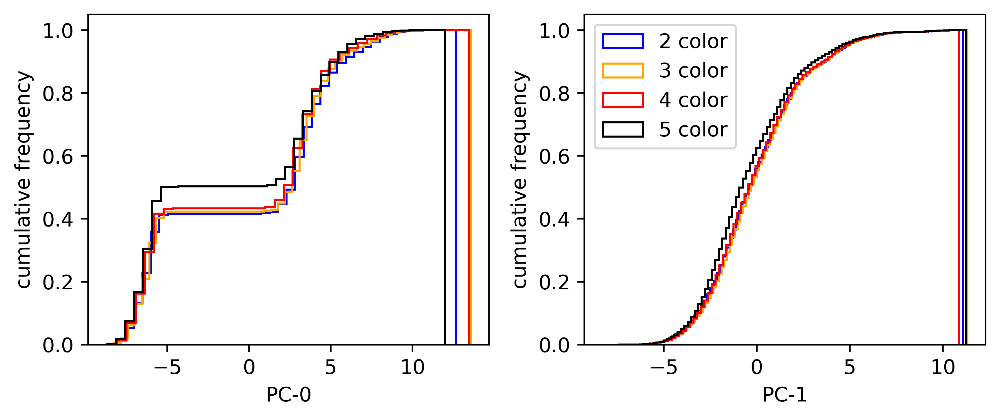

In [15]:
# %%capture
fig, axes = plt.subplots(1,2, figsize=(7,3), dpi=500)

for num_channels in set(df_merged_features['number_of_channels']):
    
    df = df_merged_features
    
    indices = df[df['number_of_channels']==num_channels].index.values

    pc0 = df_pcs_normal_scaled_with_gmm_cluster.values[:,0][indices]
    pc1 = df_pcs_normal_scaled_with_gmm_cluster.values[:,1][indices]
    
    if int(num_channels)==2:
        
        axes[0].hist(pc0, cumulative=True, histtype='step', bins='auto', density=True, color='blue', label='2 color')
        axes[1].hist(pc1, cumulative=True, histtype='step', bins='auto', density=True, color='blue', label='2 color')

    elif int(num_channels)==3:
        
        axes[0].hist(pc0, cumulative=True, histtype='step', bins='auto', density=True, color='orange', label='3 color')
        axes[1].hist(pc1, cumulative=True, histtype='step', bins='auto', density=True, color='orange', label='3 color')
    
    elif int(num_channels)==4:
        
        axes[0].hist(pc0, cumulative=True, histtype='step', bins='auto', density=True, color='red', label='4 color')
        axes[1].hist(pc1, cumulative=True, histtype='step', bins='auto', density=True, color='red', label='4 color')
        
    elif int(num_channels)==5:
        
        axes[0].hist(pc0, cumulative=True, histtype='step', bins='auto', density=True, color='black', label='5 color')
        axes[1].hist(pc1, cumulative=True, histtype='step', bins='auto', density=True, color='black', label='5 color')
                
axes[0].set_xlabel('PC-0')
axes[1].set_xlabel('PC-1')
axes[0].set_ylabel('cumulative frequency')
axes[1].set_ylabel('cumulative frequency')
plt.legend(loc='upper left')
plt.tight_layout()
# plt.savefig(unique_user_saved_outputs+'/plots/pc01_celllines.png', bbox_inches='tight')

In [16]:
# Image(filename=unique_user_saved_outputs+'/plots/pc01_celllines.png', height=500, width=500)

# compare contributions to principal components from separate cell lines, per experiment

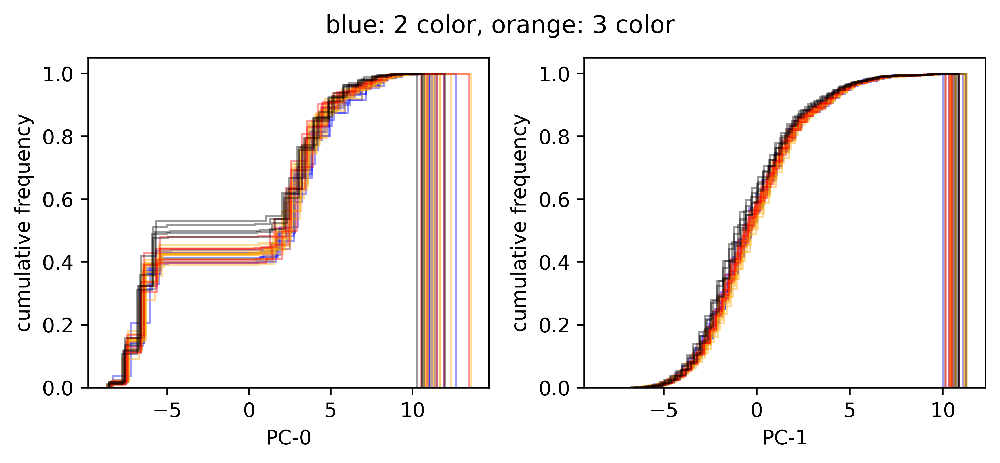

In [17]:
# %%capture
fig, axes = plt.subplots(1,2, figsize=(7,3), dpi=500)
for exp_number in range(len(set(df_merged_features['experiment_number']))):
    
    df = df_merged_features
    
    indices_exp = df[df['experiment_number']==exp_number].index.values

    pc0 = df_pcs_normal_scaled_with_gmm_cluster.values[:,0][indices_exp]
    pc1 = df_pcs_normal_scaled_with_gmm_cluster.values[:,1][indices_exp]
    
    if exp_number<8:
        
        twocolorline = axes[0].hist(pc0, cumulative=True, histtype='step', bins='auto', density=True, color='blue', alpha=0.4, label='2 color')
        twocolorline = axes[1].hist(pc1, cumulative=True, histtype='step', bins='auto', density=True, color='blue', alpha=0.4, label='2 color')

    elif exp_number>=8 and exp_number<21:
        
        threecolorline = axes[0].hist(pc0, cumulative=True, histtype='step', bins='auto', density=True, color='orange', alpha=0.4, label='3 color')
        threecolorline = axes[1].hist(pc1, cumulative=True, histtype='step', bins='auto', density=True, color='orange', alpha=0.4, label='3 color')
        
    elif exp_number>=21 and exp_number<26:
        
        threecolorline = axes[0].hist(pc0, cumulative=True, histtype='step', bins='auto', density=True, color='red', alpha=0.4, label='4 color')
        threecolorline = axes[1].hist(pc1, cumulative=True, histtype='step', bins='auto', density=True, color='red', alpha=0.4, label='4 color')

    elif exp_number>=26:
        
        threecolorline = axes[0].hist(pc0, cumulative=True, histtype='step', bins='auto', density=True, color='black', alpha=0.4, label='5 color')
        threecolorline = axes[1].hist(pc1, cumulative=True, histtype='step', bins='auto', density=True, color='black', alpha=0.4, label='5 color')

axes[0].set_xlabel('PC-0')
axes[1].set_xlabel('PC-1')
axes[0].set_ylabel('cumulative frequency')
axes[1].set_ylabel('cumulative frequency')
plt.suptitle('blue: 2 color, orange: 3 color', y=1.05)
plt.tight_layout()
# plt.savefig(unique_user_saved_outputs+'/plots/pc01_celllines_by_exp.png', bbox_inches='tight')

In [18]:
# Image(filename=unique_user_saved_outputs+'/plots/pc01_celllines_by_exp.png', height=500, width=500)

# compare features between cell lines

In [19]:
# %%capture

plt.style.use('default')

plot_position = 1 

num_columns = 5
num_rows = np.ceil(len(feature_units)/num_columns)

f = plt.figure(dpi=500, figsize=(30,30))

feature_values = df_merged_features.values

two_color_dnm2_positive = df[df['experiment_number']<8].index.values
three_color_dnm2_positive = df[df['experiment_number']>=26].index.values


for i in range(len(feature_units)):

    ax = f.add_subplot(num_rows, num_columns, plot_position)
    plot_position+=1
    
    two_color_dnm2_positive_feature  = feature_values[two_color_dnm2_positive, i]
    three_color_dnm2_positive_feature  = feature_values[three_color_dnm2_positive, i]
#     print(len(two_color_dnm2_positive_feature, ))
    ax.hist(two_color_dnm2_positive_feature, label='two color', bins='auto', density=True, histtype='step', cumulative=True)
    ax.hist(three_color_dnm2_positive_feature, label='three color', bins='auto', density=True, histtype='step', cumulative=True)

    ax.set_xlabel(df_merged_features.columns[i]+' ('+feature_units[i]+')',fontsize=5)
    ax.set_ylabel('cumulative frequency',fontsize=5)
    ax.set_xlim([np.max((np.min(two_color_dnm2_positive_feature),np.min(three_color_dnm2_positive_feature))),
                 np.min((np.max(two_color_dnm2_positive_feature),np.max(three_color_dnm2_positive_feature)))])
    ax.tick_params(axis='both', which='major', labelsize=3)
    ax.tick_params(axis='both', which='minor', labelsize=3)
    plt.legend(loc='best')
    plt.grid()
    
f.suptitle('track features, comparing DNM2 positive events between two cell lines')
# f.savefig(unique_user_saved_outputs+'/plots/feature_comparison_dnm2_positive.png')

Text(0.5, 0.98, 'track features, comparing DNM2 positive events between two cell lines')

In [20]:
# Image(filename=unique_user_saved_outputs+'/plots/feature_comparison_dnm2_positive.png', height=500, width=500)

# get indices of GMM cluster events

In [21]:
num_gmm_clusters = number_of_clusters # optimal number of clusters of PCA data

gmm_classes = []

for i in range(num_gmm_clusters):

    gmm_classes.append(df_pcs_normal_scaled_with_gmm_cluster[df_pcs_normal_scaled_with_gmm_cluster['gmm_predictions']==i].index.values)    

# isolate hot-spots/non-peaked events and individual CCP from DNM2 positive events

In [22]:
tracks_dnm2_positive = merged_all_valid_tracks[gmm_classes[index_DNM2positive]] #DNM2 positive events, mixed CCPS and hot-spots

In [23]:
lifetimes = []

for i in range(len(tracks_dnm2_positive)):

    lifetimes.append(return_track_attributes.return_track_lifetime(tracks_dnm2_positive,i))

In [24]:
experiment_number_track_candidates = df_merged_features['experiment_number'][gmm_classes[index_DNM2positive]] # experiment numbers (1-16)

# split CCP tracks by 2 and 3 color experiments

In [25]:
df = df_pcs_normal_scaled_with_gmm_cluster
indices_in_experiment_class_authenticCME = list(df[(df.gmm_predictions==index_DNM2positive)].index)
indices_ccp_from_net_array = list(np.array(indices_in_experiment_class_authenticCME)[indices_ccp])
indices_2color_class_authenticCME = np.sort(list(set(indices_ccp_from_net_array) & set(list(df_merged_features.loc[df_merged_features['number_of_channels']==2].index))))
indices_3color_class_authenticCME = np.sort(list(set(indices_ccp_from_net_array) & set(list(df_merged_features.loc[df_merged_features['number_of_channels']==5].index))))

# feature comparison between cell lines' CCPs

In [26]:
# %%capture

plt.style.use('default')

plot_position = 1 

f = plt.figure(dpi=500, figsize=(30,30))

feature_values = df_merged_features.values


for i in range(len(feature_units)):

    ax = f.add_subplot(num_rows, num_columns, plot_position)
    plot_position+=1
    
    two_color_ccp_feature  = feature_values[indices_2color_class_authenticCME, i]
    three_color_ccp_feature  = feature_values[indices_3color_class_authenticCME, i]
#     print(len(two_color_dnm2_positive_feature, ))
    ax.hist(two_color_ccp_feature, label='two color', bins='auto', density=True, histtype='step', cumulative=True)
    ax.hist(three_color_ccp_feature, label='three color', bins='auto', density=True, histtype='step', cumulative=True)

    ax.set_xlabel(df_merged_features.columns[i]+' ('+feature_units[i]+')',fontsize=5)
    ax.set_ylabel('cumulative frequency',fontsize=5)
    ax.set_xlim([np.max((np.min(two_color_ccp_feature),np.min(three_color_ccp_feature))),
                 np.min((np.max(two_color_ccp_feature),np.max(three_color_ccp_feature)))])
    ax.tick_params(axis='both', which='major', labelsize=3)
    ax.tick_params(axis='both', which='minor', labelsize=3)
    plt.legend(loc='best')
    plt.grid()
    
    
f.suptitle('track features, comparing CCP events between two cell lines')
# f.savefig(unique_user_saved_outputs+'/plots/feature_comparison_ccps.png')

Text(0.5, 0.98, 'track features, comparing CCP events between two cell lines')

In [27]:
# Image(filename=unique_user_saved_outputs+'/plots/feature_comparison_ccps.png', height=500, width=500)

# compare lifetimes separated by 2 and 3 color experiments

In [28]:
lifetimes_2color_class_authenticCME = df_merged_features[['lifetime']].values[indices_2color_class_authenticCME].reshape(len(indices_2color_class_authenticCME),)
lifetimes_3color_class_authenticCME = df_merged_features[['lifetime']].values[indices_3color_class_authenticCME].reshape(len(indices_3color_class_authenticCME),)
maxintch0_2color_class_authenticCME = df_merged_features[['max_int_ap2']].values[indices_2color_class_authenticCME].reshape(len(indices_2color_class_authenticCME),)
maxintch0_3color_class_authenticCME = df_merged_features[['max_int_ap2']].values[indices_3color_class_authenticCME].reshape(len(indices_3color_class_authenticCME),)
maxintch1_2color_class_authenticCME = df_merged_features[['max_int_dnm2']].values[indices_2color_class_authenticCME].reshape(len(indices_2color_class_authenticCME),)
maxintch1_3color_class_authenticCME = df_merged_features[['max_int_dnm2']].values[indices_3color_class_authenticCME].reshape(len(indices_3color_class_authenticCME),)

# merge lifetimes and maximum AP2/DNM2 intensities between 2 and 3 color experiments

In [29]:
all_lifetimes = np.array(list(lifetimes_2color_class_authenticCME)+list(lifetimes_3color_class_authenticCME)).flatten()
all_maxintch0 = np.array(list(maxintch0_2color_class_authenticCME)+list(maxintch0_3color_class_authenticCME)).flatten()
all_maxintch1 = np.array(list(maxintch1_2color_class_authenticCME)+list(maxintch1_3color_class_authenticCME)).flatten()

num_channels = [2 if i < len(lifetimes_2color_class_authenticCME) else 3 for i,_ in enumerate(all_lifetimes)]

# calculate the difference in variances between 2 and 3 color cell lines' lifetimes and maximum AP2/DNM2 intensities

In [30]:
# compare the variances between 2 and 3 color cell line
pval_var_lifetime = stats.levene(lifetimes_2color_class_authenticCME, lifetimes_3color_class_authenticCME)[1]

pval_var_ap2max = stats.levene(maxintch0_2color_class_authenticCME, maxintch0_3color_class_authenticCME)[1]

pval_var_dnm2max = stats.levene(maxintch1_2color_class_authenticCME, maxintch1_3color_class_authenticCME)[1]

print('for the 2 and 3 color cell line, test the null hypothesis that the variances of the samples are equal')
print('the p-value lifetimes:', pval_var_lifetime)
print('the p-value maximum AP2 intensity:', pval_var_ap2max)
print('the p-value maximum DNM2 intensity:', pval_var_dnm2max)

for the 2 and 3 color cell line, test the null hypothesis that the variances of the samples are equal
the p-value lifetimes: 2.0400757592638588e-17
the p-value maximum AP2 intensity: 1.7553418074949721e-43
the p-value maximum DNM2 intensity: 9.6980356302976e-06


In [31]:
def cohen_d(x,y): #https://stackoverflow.com/questions/21532471/how-to-calculate-cohens-d-in-python
    nx = len(x)
    ny = len(y)
    dof = nx + ny - 2
    return (np.mean(x) - np.mean(y)) / np.sqrt(((nx-1)*np.std(x, ddof=1) ** 2 + (ny-1)*np.std(y, ddof=1) ** 2) / dof)

# compare lifetimes between 2 and 3 color experiments

In [32]:
# dataframe of ccp lifetime and maximum intensities separated by cell line
df_2_3_color_lifetimes = pd.DataFrame(data=np.stack((all_lifetimes,all_maxintch0,all_maxintch1,num_channels),axis=1),columns=['lifetime','maxintch0','maxintch1','num_channels'])

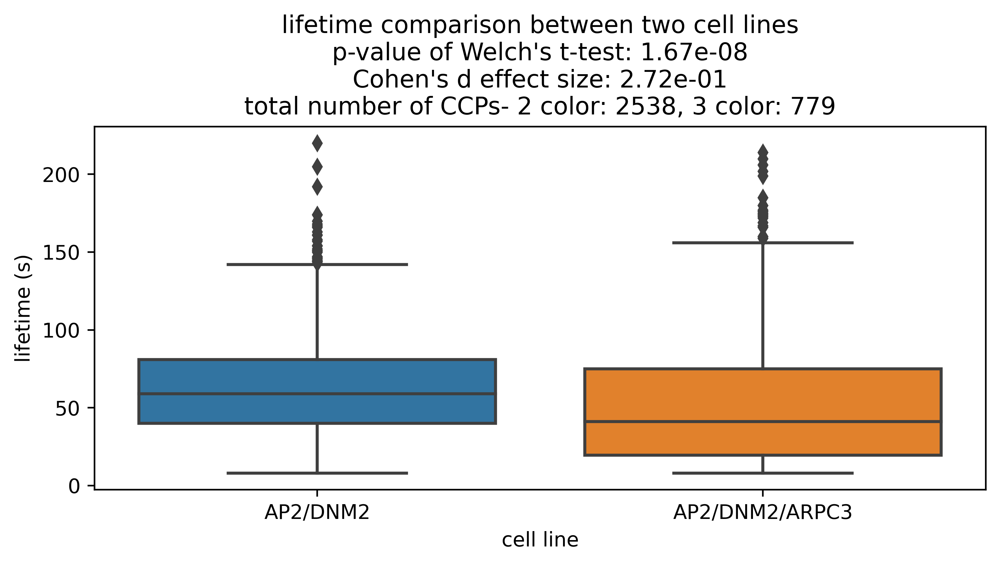

In [34]:
# %%capture

plt.style.use('default')

plt.rcParams["figure.dpi"]=500
plt.rcParams["figure.figsize"]=(7,4)
ax = sns.boxplot(x="num_channels", y="lifetime", data=df_2_3_color_lifetimes)

welchtest = stats.ttest_ind(lifetimes_2color_class_authenticCME, lifetimes_3color_class_authenticCME,equal_var=False)
cohentest = cohen_d(lifetimes_2color_class_authenticCME, lifetimes_3color_class_authenticCME)

plt.title('lifetime comparison between two cell lines'+
          "\np-value of Welch's t-test: " + "{:.2e}".format(welchtest[1]) + 
          "\nCohen's d effect size: " + "{:.2e}".format(cohentest) + 
          '\ntotal number of CCPs- 2 color: ' + "{:}".format(len(lifetimes_2color_class_authenticCME)) + 
          ', 3 color: ' + "{:,}".format(len(lifetimes_3color_class_authenticCME)))

plt.xlabel('cell line')
ax.set_xticklabels(['AP2/DNM2','AP2/DNM2/ARPC3'])

plt.ylabel('lifetime (s)')    
plt.tight_layout()
# plt.save
# fig(unique_user_saved_outputs+'/plots/lifetime_comparison_boxplot_celllines.png')

In [35]:
# Image(filename=unique_user_saved_outputs+'/plots/lifetime_comparison_boxplot_celllines.png', height=500, width=500)

# compare max AP2 intensities between 2 and 3 color experiments

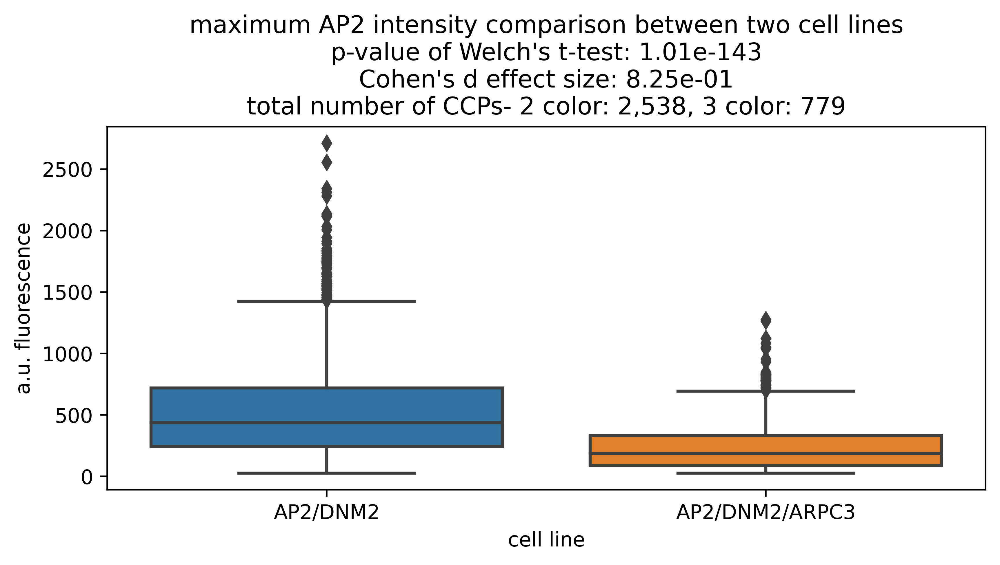

In [36]:
# %%capture

plt.style.use('default')

plt.rcParams["figure.dpi"]=500
plt.rcParams["figure.figsize"]=(7,4)
ax = sns.boxplot(x="num_channels", y="maxintch0", data=df_2_3_color_lifetimes)

welchtest = stats.ttest_ind(maxintch0_2color_class_authenticCME, maxintch0_3color_class_authenticCME,equal_var=False)
cohentest = cohen_d(maxintch0_2color_class_authenticCME, maxintch0_3color_class_authenticCME)

plt.title('maximum AP2 intensity comparison between two cell lines'+
          "\np-value of Welch's t-test: " + "{:.2e}".format(welchtest[1]) + 
          "\nCohen's d effect size: " + "{:.2e}".format(cohentest) + 
          '\ntotal number of CCPs- 2 color: ' + "{:,}".format(len(maxintch0_2color_class_authenticCME)) + 
          ', 3 color: ' + "{:,}".format(len(maxintch0_3color_class_authenticCME)))

plt.xlabel('cell line')
ax.set_xticklabels(['AP2/DNM2','AP2/DNM2/ARPC3'])

plt.ylabel('a.u. fluorescence')

plt.tight_layout()
# plt.savefig(unique_user_saved_outputs+'/plots/ap2max_comparison_boxplot_celllines.png')

In [37]:
# Image(filename=unique_user_saved_outputs+'/plots/ap2max_comparison_boxplot_celllines.png', height=500, width=500)

# compare max DNM2 intensities between 2 and 3 color experiments

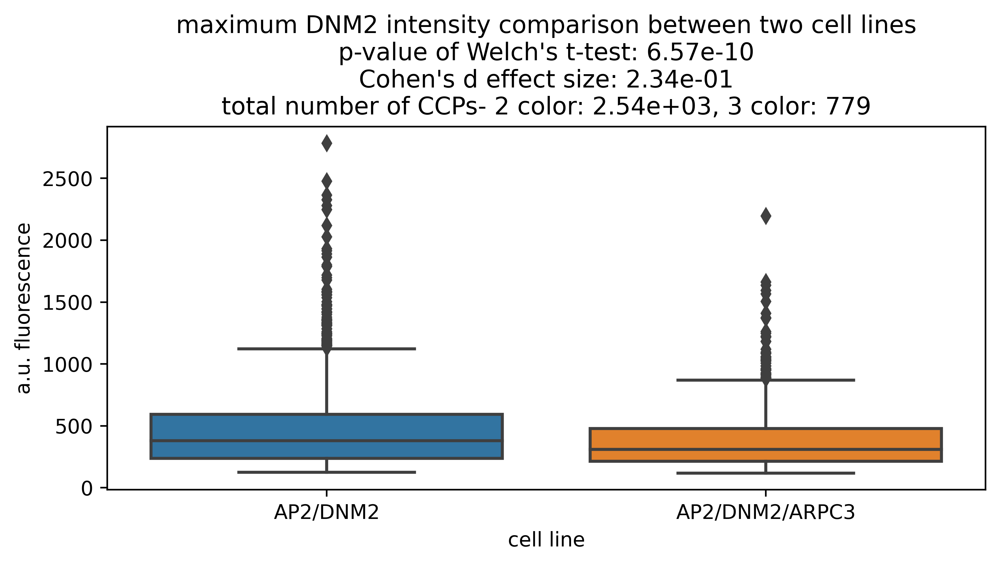

In [38]:
# %%capture

plt.style.use('default')

plt.rcParams["figure.dpi"]=500
plt.rcParams["figure.figsize"]=(7,4)
ax = sns.boxplot(x="num_channels", y="maxintch1", data=df_2_3_color_lifetimes)

welchtest = stats.ttest_ind(maxintch1_2color_class_authenticCME, maxintch1_3color_class_authenticCME,equal_var=False)
cohentest = cohen_d(maxintch1_2color_class_authenticCME, maxintch1_3color_class_authenticCME)

plt.title('maximum DNM2 intensity comparison between two cell lines'+
          "\np-value of Welch's t-test: " + "{:.2e}".format(welchtest[1]) + 
          "\nCohen's d effect size: " + "{:.2e}".format(cohentest) + 
          '\ntotal number of CCPs- 2 color: ' + "{:.2e}".format(len(maxintch1_2color_class_authenticCME)) + 
          ', 3 color: ' + "{:,}".format(len(maxintch1_3color_class_authenticCME)))

plt.xlabel('cell line')
ax.set_xticklabels(['AP2/DNM2','AP2/DNM2/ARPC3'])

plt.ylabel('a.u. fluorescence')

plt.tight_layout()
# plt.savefig(unique_user_saved_outputs+'/plots/dnm2max_comparison_boxplot_celllines.png')

In [39]:
# Image(filename=unique_user_saved_outputs+'/plots/dnm2max_comparison_boxplot_celllines.png', height=500, width=500)

# measure AP2 initiation to DNM2 peak lifetime, comparing 2 cell lines

In [40]:
ccp_events_per_experiment_all = [] # each entry if a list of all predicted ccps from each experiment
hotspot_events_per_experiment_all = [] # each entry if a list of all predicted hotspots/non-peaked events from each experiment

for experiment_number in range(len(set(df_merged_features['experiment_number']))): # iterate through all experiments
    
    current_exp_ind = np.where(experiment_number_track_candidates==experiment_number)[0]
    hotspot_pred_exp = ccp_predictions[current_exp_ind]
    tracks_exp = tracks_dnm2_positive[current_exp_ind]
    
    non_hotspot_ind = np.where(hotspot_pred_exp==1)[0]
    tracks_single_ccp_exp = tracks_exp[non_hotspot_ind]
    ccp_events_per_experiment_all.append(tracks_single_ccp_exp)
    
    hotspot_ind = np.where(hotspot_pred_exp==0)[0]
    tracks_hotspot_exp = tracks_exp[hotspot_ind]
    hotspot_events_per_experiment_all.append(tracks_hotspot_exp)
    
lifetimes_2_color = []
lifetimes_3_color = []
ap2initiation_dnm2peak_2_color = []
ap2initiation_dnm2peak_3_color = []

for experiment_number in range(len(set(df_merged_features['experiment_number']))):
    
    experiment_tracks = ccp_events_per_experiment_all[experiment_number]
    
    for track_num in range(len(experiment_tracks)):
        
        if experiment_number < 8:
            
            lifetimes_2_color.append(return_track_attributes.return_track_lifetime(experiment_tracks,
                                                                                   track_num))
            
            ap2initiation_dnm2peak_2_color.append(np.argmax(return_track_attributes.return_track_amplitude_no_buffer_channel(experiment_tracks,
                                                                                                                             track_num,
                                                                                                                             1)))
        elif experiment_number>25:
            
            lifetimes_3_color.append(return_track_attributes.return_track_lifetime(experiment_tracks,
                                                                                   track_num))
            
            ap2initiation_dnm2peak_3_color.append(np.argmax(return_track_attributes.return_track_amplitude_no_buffer_channel(experiment_tracks,
                                                                                                                 track_num,
                                                                                                                 1)))
            
hotspot_lifetime_2_color = []
hotspot_lifetime_3_color = []

for experiment_number in range(len(set(df_merged_features['experiment_number']))):
    
    experiment_tracks = hotspot_events_per_experiment_all[experiment_number-1]
    
    for track_num in range(len(experiment_tracks)):
        
        if experiment_number < 8:
            
            hotspot_lifetime_2_color.append(return_track_attributes.return_track_lifetime(experiment_tracks,
                                                                                   track_num))
        else:
            
            hotspot_lifetime_3_color.append(return_track_attributes.return_track_lifetime(experiment_tracks,
                                                                                   track_num))

# compare lifetimes of 2 cell lines

Text(0.5, 1.0, 'CCP event AP2 lifetimes\np-value of Kolmogorov-Smirnov test: 6.66e-16')

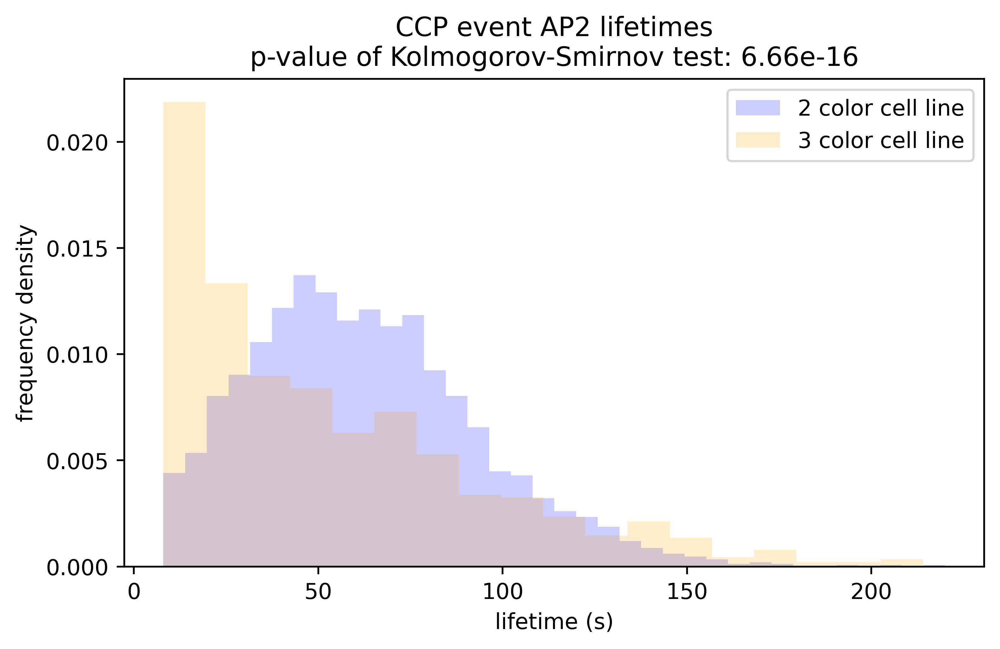

In [41]:
# %%capture

plt.style.use('default')

plt.rcParams["figure.dpi"]=500
plt.rcParams["figure.figsize"]=(7,4)

pvalks = stats.kstest(lifetimes_2_color,lifetimes_3_color)[1]

plt.hist(lifetimes_2_color,
         bins='auto',
         alpha=0.2,
         density=True,
         label='2 color cell line',
         color='blue')
plt.hist(lifetimes_3_color,
         bins='auto',
         alpha=0.2,
         density=True,
         label='3 color cell line',
         color='orange')
plt.legend()
plt.xlabel('lifetime (s)')
plt.ylabel('frequency density')
plt.title('CCP event AP2 lifetimes\np-value of Kolmogorov-Smirnov test: ' + "{:.2e}".format(pvalks))

# plt.savefig(unique_user_saved_outputs+'/plots/lifetime_histogram_comparison_celllines.png')

In [42]:
# Image(filename=unique_user_saved_outputs+'/plots/lifetime_histogram_comparison_celllines.png', height=500, width=500)

Text(0.5, 1.0, 'CCP event AP2 lifetimes\np-value of Kolmogorov-Smirnov test: 6.66e-16')

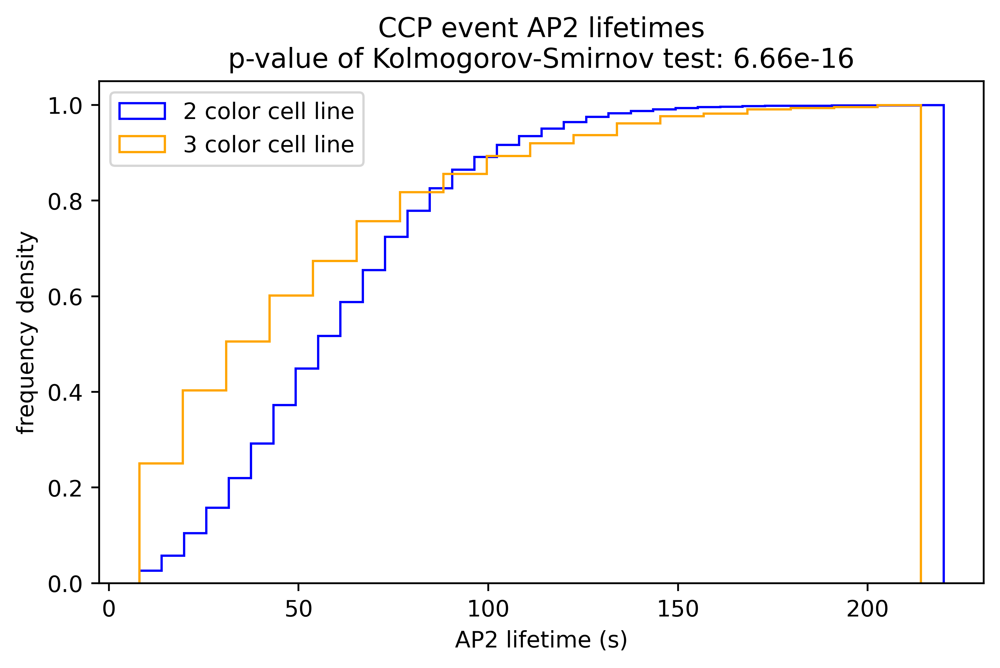

In [43]:
# %%capture

plt.style.use('default')

plt.rcParams["figure.dpi"]=500
plt.rcParams["figure.figsize"]=(7,4)


plt.hist(lifetimes_2_color,
         bins='auto',
         alpha=1,
         density=True,
         histtype='step', 
         cumulative=True,
         label='2 color cell line',
         color='blue')

plt.hist(lifetimes_3_color,
         bins='auto',
         alpha=1,
         density=True,
         histtype='step', 
         cumulative=True,
         label='3 color cell line',
         color='orange')

plt.legend(loc='upper left')
plt.xlabel('AP2 lifetime (s)')
plt.ylabel('frequency density')
plt.title('CCP event AP2 lifetimes\np-value of Kolmogorov-Smirnov test: ' + "{:.2e}".format(pvalks))

# plt.savefig(unique_user_saved_outputs+'/plots/lifetime_cdf_histogram_comparison_celllines.png')

In [44]:
# Image(filename=unique_user_saved_outputs+'/plots/lifetime_cdf_histogram_comparison_celllines.png', height=500, width=500)

# compare CCP lifetimes of 2 cell lines

Text(0.5, 1.0, 'CCP events, time from AP2 initiation to DNM2 peak (scission) \np-value of Kolmogorov-Smirnov test: 6.66e-16')

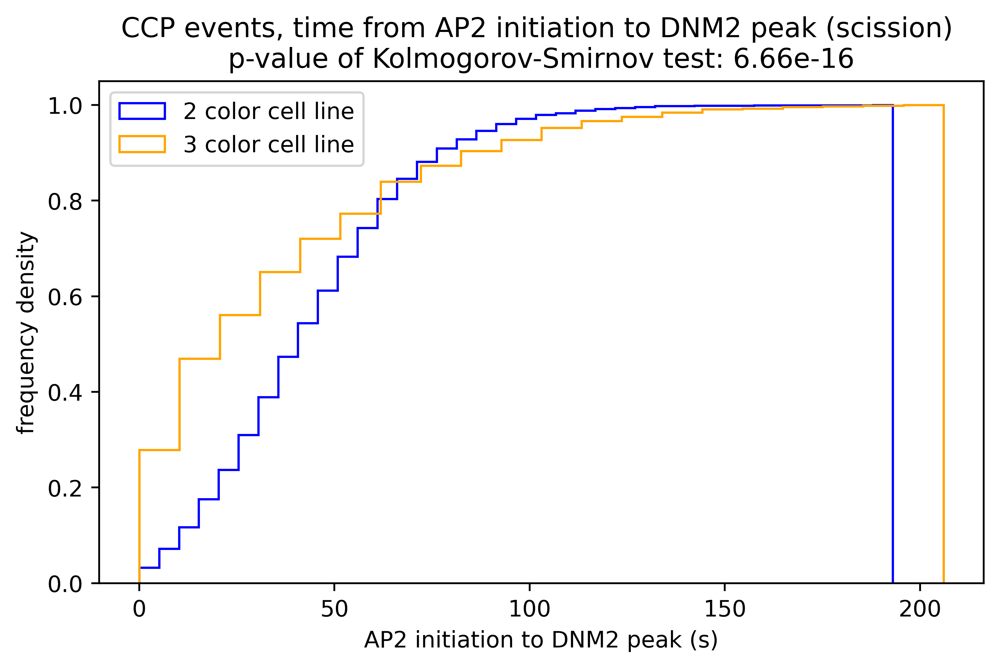

In [46]:
# %%capture

plt.style.use('default')

plt.rcParams["figure.dpi"]=500
plt.rcParams["figure.figsize"]=(7,4)

pvalks = stats.kstest(ap2initiation_dnm2peak_3_color,ap2initiation_dnm2peak_2_color)[1]

plt.hist(ap2initiation_dnm2peak_2_color,
         bins='auto',
         alpha=1,
         density=True,
         histtype='step', 
         cumulative=True,
         label='2 color cell line',
         color='blue')

plt.hist(ap2initiation_dnm2peak_3_color,
         bins='auto',
         alpha=1,
         density=True,
         histtype='step', 
         cumulative=True,
         label='3 color cell line',
         color='orange')

plt.legend(loc='upper left')
plt.xlabel('AP2 initiation to DNM2 peak (s)')
plt.ylabel('frequency density')
plt.title('CCP events, time from AP2 initiation to DNM2 peak (scission) \np-value of Kolmogorov-Smirnov test: ' + "{:.2e}".format(pvalks))

# plt.savefig(unique_user_saved_outputs+'/plots/ap2dnm2peak_cdf_histogram_comparison_celllines.png')

In [47]:
# Image(filename=unique_user_saved_outputs+'/plots/ap2dnm2peak_cdf_histogram_comparison_celllines.png', height=500, width=500)

Text(0.5, 1.0, 'CCP events, time from AP2 initiation to DNM2 peak (scission) \np-value of Kolmogorov-Smirnov test: 6.66e-16')

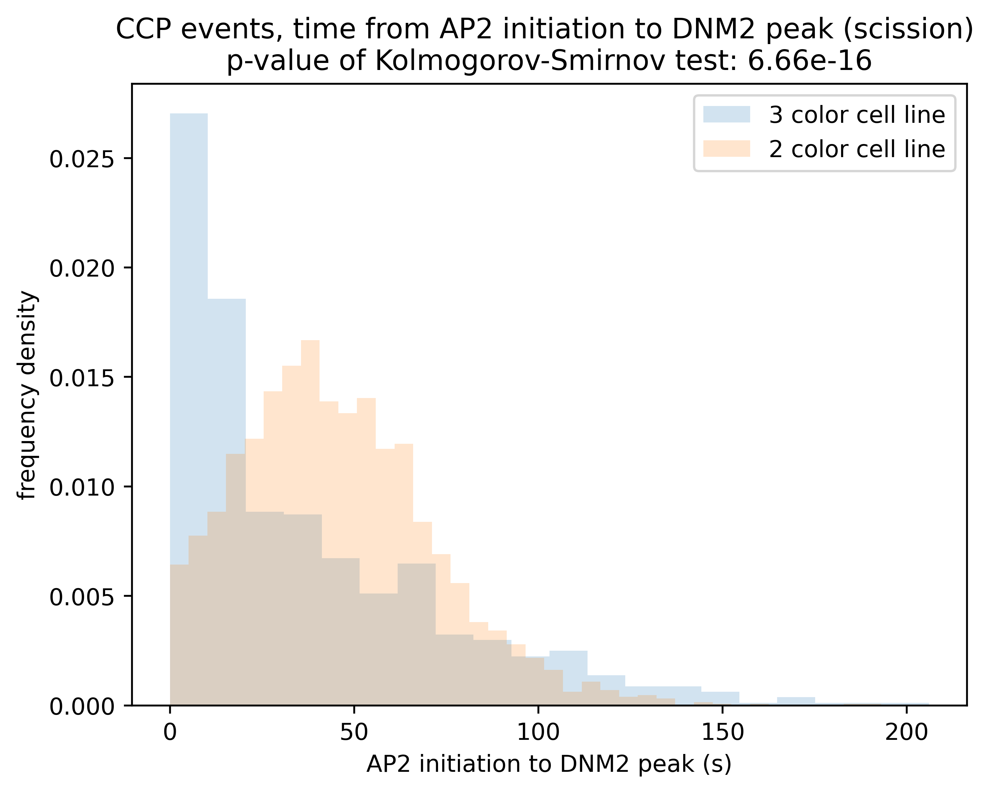

In [48]:
# %%capture

plt.style.use('default')
plt.figure(dpi=500)
plt.hist(ap2initiation_dnm2peak_3_color,
         bins='auto',
         alpha=0.2,
         density=True,
         label='3 color cell line')
plt.hist(ap2initiation_dnm2peak_2_color,
         bins='auto',
         alpha=0.2,
         density=True,
         label='2 color cell line')
plt.legend()
plt.xlabel('AP2 initiation to DNM2 peak (s)')
plt.ylabel('frequency density')
plt.title('CCP events, time from AP2 initiation to DNM2 peak (scission) \np-value of Kolmogorov-Smirnov test: ' + "{:.2e}".format(pvalks))
# plt.savefig(unique_user_saved_outputs+'/plots/ap2initiationdnm2peak_comparing_celllines.png')

In [49]:
# Image(filename=unique_user_saved_outputs+'/plots/ap2initiationdnm2peak_comparing_celllines.png', height=500, width=500)

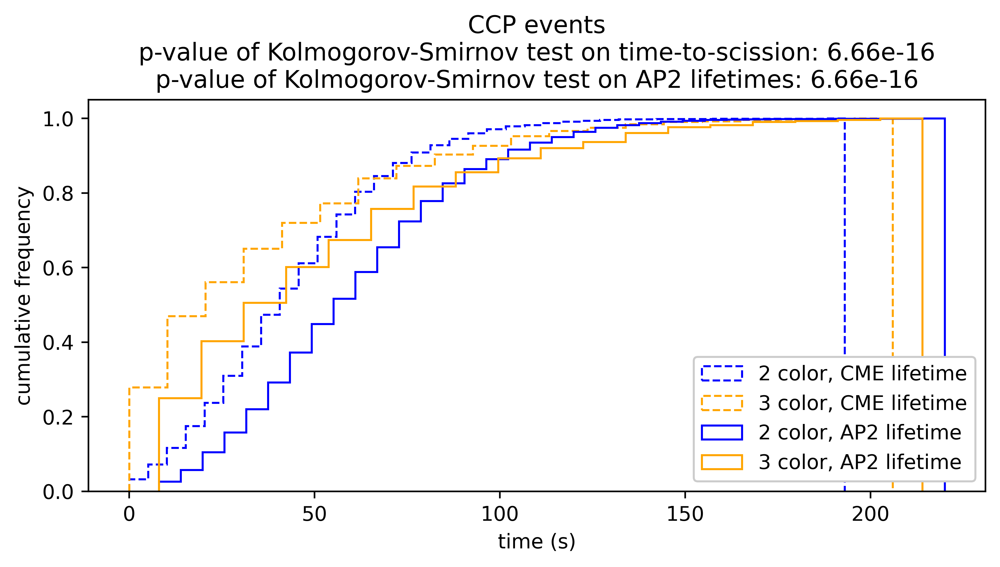

In [50]:
# %%capture

plt.style.use('default')

plt.rcParams["figure.dpi"]=500
plt.rcParams["figure.figsize"]=(7,4)

pvalks_lifetime = stats.kstest(lifetimes_2_color,lifetimes_3_color)[1]
pvalks_timetoscission = stats.kstest(ap2initiation_dnm2peak_3_color,ap2initiation_dnm2peak_2_color)[1]

plt.hist(ap2initiation_dnm2peak_2_color,
         bins='auto',
         alpha=1,
         density=True,
         histtype='step', 
         cumulative=True,
         label='2 color, CME lifetime',
         color='blue',
         linestyle='dashed')
plt.hist(ap2initiation_dnm2peak_3_color,
         bins='auto',
         alpha=1,
         density=True,
         histtype='step', 
         cumulative=True,
         label='3 color, CME lifetime',
         color='orange',
         linestyle='dashed')
plt.hist(lifetimes_2_color,
         bins='auto',
         alpha=1,
         density=True,
         histtype='step', 
         cumulative=True,
         label='2 color, AP2 lifetime',
         color='blue')
plt.hist(lifetimes_3_color,
         bins='auto',
         alpha=1,
         density=True,
         histtype='step', 
         cumulative=True,
         label='3 color, AP2 lifetime',
         color='orange')


plt.legend(loc='lower right', framealpha=1)
plt.xlabel('time (s)')
plt.ylabel('cumulative frequency')
plt.title('CCP events\np-value of Kolmogorov-Smirnov test on time-to-scission: ' + "{:.2e}".format(pvalks_timetoscission)+'\np-value of Kolmogorov-Smirnov test on AP2 lifetimes: ' + "{:.2e}".format(pvalks_lifetime))
plt.tight_layout()
# plt.savefig(unique_user_saved_outputs+'/plots/ap2dnm2peak_and_lifetime_cdf_histogram_comparison_celllines_merged.png')

In [51]:
# Image(filename=unique_user_saved_outputs+'/plots/ap2dnm2peak_and_lifetime_cdf_histogram_comparison_celllines_merged.png', height=500, width=500)

# KS test between lifetimes between cell lines, comparing portions of distributions

In [50]:
minimum_lifetime = np.min(list(lifetimes_2_color)+list(lifetimes_3_color))
maximum_lifetime = np.max(list(lifetimes_2_color)+list(lifetimes_3_color))
min_lifetime_mesh, max_lifetime_mesh = np.meshgrid(np.arange(minimum_lifetime, maximum_lifetime+1), 
                                                   np.arange(minimum_lifetime, maximum_lifetime+1))

In [51]:
lifetimes_first_sample = np.array(lifetimes_2_color)
lifetimes_second_sample = np.array(lifetimes_3_color)

def calculate_ks_within_lifetime_bounds(minimum_lifetime, 
                                        maximum_lifetime):

    lifetimes_within_bounds_first_sample = lifetimes_first_sample[(lifetimes_first_sample >= minimum_lifetime) & (lifetimes_first_sample <= maximum_lifetime)]
    lifetimes_within_bounds_second_sample = lifetimes_second_sample[(lifetimes_second_sample >= minimum_lifetime) & (lifetimes_second_sample <= maximum_lifetime)]
    
    if len(lifetimes_within_bounds_first_sample)>0 and len(lifetimes_within_bounds_second_sample)>0:
    
        return stats.kstest(lifetimes_within_bounds_first_sample,lifetimes_within_bounds_second_sample)[1]
    
    else:
        
        return np.NaN



In [52]:
vectorized_calculate_ks_within_lifetime_bounds = np.vectorize(calculate_ks_within_lifetime_bounds)

In [53]:
ks_pvals = vectorized_calculate_ks_within_lifetime_bounds(min_lifetime_mesh, 
                                                   max_lifetime_mesh)

In [54]:
class MidpointNormalize(mpl.colors.Normalize): # https://stackoverflow.com/questions/7404116/defining-the-midpoint-of-a-colormap-in-matplotlib
    def __init__(self, vmin, vmax, midpoint=0, clip=False):
        self.midpoint = midpoint
        mpl.colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        normalized_min = max(0, 1 / 2 * (1 - abs((self.midpoint - self.vmin) / (self.midpoint - self.vmax))))
        normalized_max = min(1, 1 / 2 * (1 + abs((self.vmax - self.midpoint) / (self.midpoint - self.vmin))))
        normalized_mid = 0.5
        x, y = [self.vmin, self.midpoint, self.vmax], [normalized_min, normalized_mid, normalized_max]
        return np.ma.masked_array(np.interp(value, x, y))

In [55]:
def define_restricted_comparison_regions(minimum_lifetime, maximum_lifetime):
    
    if maximum_lifetime < minimum_lifetime:
        
        return 0
    
    else:
        
        return 1
    
vectorized_define_restricted_comparison_regions = np.vectorize(define_restricted_comparison_regions)    

In [56]:
restricted_lifetime_comparisons = vectorized_define_restricted_comparison_regions(min_lifetime_mesh, 
                                                                                  max_lifetime_mesh)

In [57]:
num_counted = np.count_nonzero(restricted_lifetime_comparisons==0) 
number_significantly_different = np.count_nonzero(ks_pvals<0.05)
number_similar = np.count_nonzero(ks_pvals>0.05)
number_noncomparable = np.count_nonzero(np.isnan(ks_pvals)) - np.count_nonzero(restricted_lifetime_comparisons==1)
percent_number_significantly_different = np.around(100*number_significantly_different/num_counted,2)
percent_number_similar = np.around(100*number_similar/num_counted,2)
percent_number_noncomparable = np.around(100*number_noncomparable/num_counted,2)

# observe where the lifetime distributions of the two cell lines diverge

In [58]:
%%capture
plt.style.use('default')

fig, axs = plt.subplots(1,1, constrained_layout=True, figsize=(10,10), dpi=500)
vmin = 0
vmax = 0.3
norm = MidpointNormalize(vmin=vmin, vmax=vmax, midpoint=0.05)
cmap = 'bwr'

pvalks = stats.kstest(lifetimes_2_color,lifetimes_3_color)[1]


axs.imshow(restricted_lifetime_comparisons, 
           alpha=0.3,
           origin='lower', 
           interpolation='none', 
           cmap='viridis', 
           aspect='auto',
           extent=[minimum_lifetime,maximum_lifetime,minimum_lifetime,maximum_lifetime])

sc = axs.imshow(ks_pvals, 
                alpha=1.0,
                origin='lower', 
                interpolation='none', 
                cmap=cmap, 
                aspect='auto', 
                norm=norm,
                extent=[minimum_lifetime,maximum_lifetime,minimum_lifetime,maximum_lifetime])



cba = fig.colorbar(sc,shrink=1, location='right')
cba.set_ticks(np.arange(0,0.325,0.025))
# cba.ax.set_xticklabels(np.arange(0,0.325,0.025))  # horizontal colorbar
cba.set_label('p-value of KS test', rotation=90, fontsize=20)


cba.ax.plot([0, 1], [0.04, 0.04], 'black')
cba.ax.plot([0, 1], [0.06, 0.06], 'black')

cba.ax.text(0.2, 0.007, 'non-equal fit', rotation=90)
cba.ax.text(0.2, 0.065, 'equal fit', rotation=90)

plt.xlabel('minimum lifetime (s)', fontsize=20)
plt.ylabel('maximum lifetime (s)', fontsize=20)
plt.title('comparison between 2 and 3 color cell line lifetime distributions')

l2 = np.array((5, 5)) # https://matplotlib.org/3.1.0/gallery/text_labels_and_annotations/text_rotation_relative_to_line.html
trans_angle = plt.gca().transData.transform_angles(np.array((45,)),
                                                   l2.reshape((1, 2)))[0]


th2 = plt.text(int(maximum_lifetime/2)-25, 100-25, 'minimum lifetime > maximum lifetime', fontsize=14,
               rotation=trans_angle, rotation_mode='anchor', color='black', fontweight='bold')


th2 = plt.text(173, 175, 'no values to compare', fontsize=14,
               rotation=trans_angle, rotation_mode='anchor', color='black', fontweight='bold')


rect = patches.Rectangle((113.75,8),
                         105,
                         85,
                         linewidth=1,
                         alpha=1.0, 
                         ec=(1,1,1),
                         fc=(1,1,1))


axs.text(10, 215.75, 'p<0.05: ' + "{:,}".format(percent_number_significantly_different) + '%', rotation=0, fontweight='bold', fontsize=12)
axs.text(100, 215.75, 'p>0.05: ' + "{:,}".format(percent_number_similar) + '%', rotation=0, fontweight='bold', fontsize=12)
axs.text(173, 215.75, 'null: ' + "{:,}".format(percent_number_noncomparable) + '%', rotation=0, fontweight='bold', fontsize=12)

# axs.add_patch(rect)


axins = axs.inset_axes([0.565, 0.050, 0.43, 0.38])
axins.hist(lifetimes_2_color,
         bins='auto',
         alpha=1,
         density=True,
         histtype='step',
         label='2 color cell line' + 
               '\nN='+"{:,}".format(len(lifetimes_2_color)))
axins.hist(lifetimes_3_color,
         bins='auto',
         alpha=1,
         density=True,
         histtype='step',
         label='3 color cell line' + 
               '\nN='+"{:,}".format(len(lifetimes_3_color)))

axins.axvline(minimum_lifetime, linestyle='--', ymax=0.35, color='black')
axins.axvline(maximum_lifetime, linestyle='--', ymax=0.35, color='black')

axins.text(minimum_lifetime-3, 0.006, 'minimum lifetime', rotation=90)
axins.text(maximum_lifetime-3, 0.006, 'maximum lifetime', rotation=90)

axins.legend(frameon=False)
axins.set_xlabel('lifetime (s)')
axins.set_ylabel('frequency density')
axins.set_title('CCP lifetimes' + 
                '\np-value: ' + str(np.around(pvalks, 10)))

axins.set_facecolor('white')

plt.savefig(unique_user_saved_outputs+'/plots/lifetime_cellline_comparison_heatmap.png')

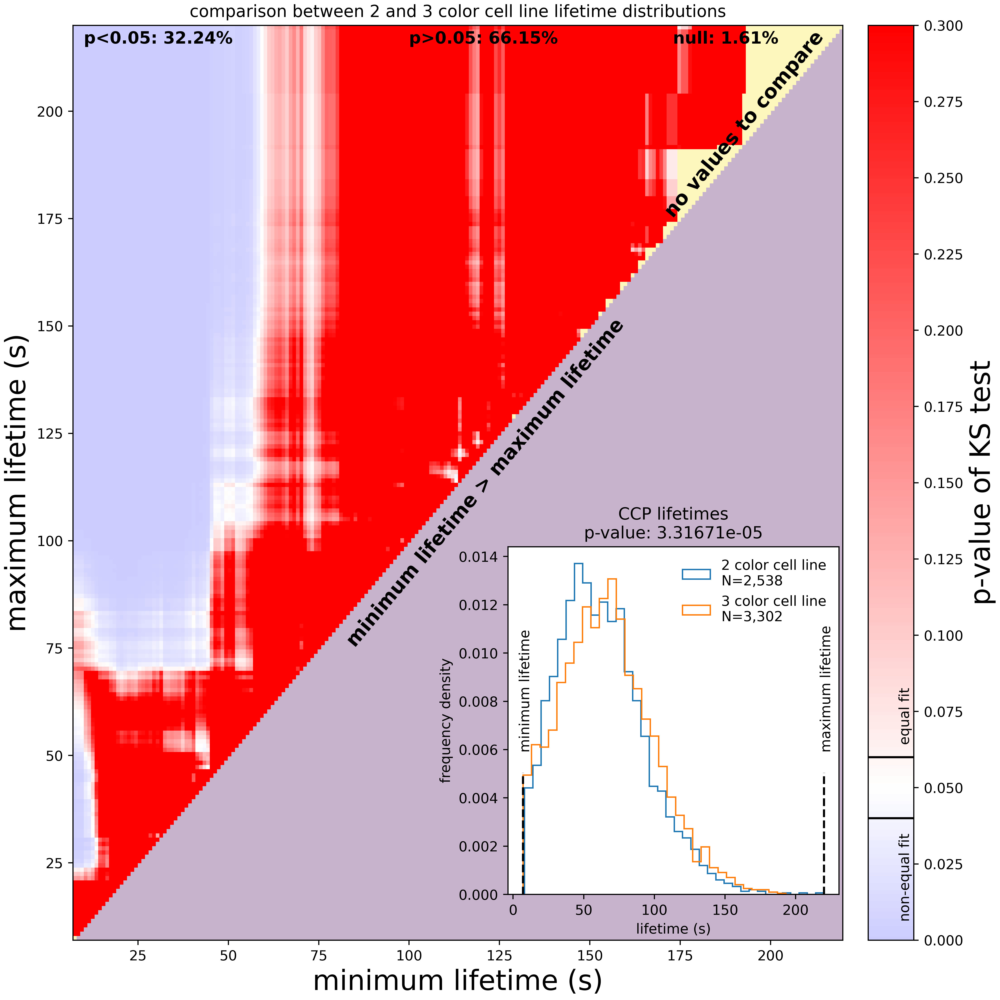

In [59]:
Image(filename=unique_user_saved_outputs+'/plots/lifetime_cellline_comparison_heatmap.png', height=500, width=500)

# upload cmeAnalysis cell_masks and calculate area of colonies

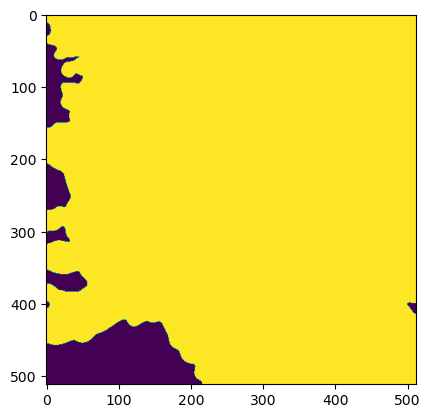

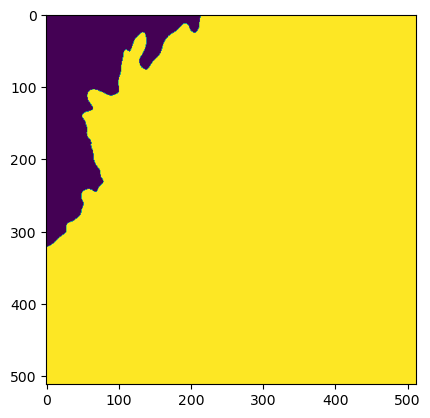

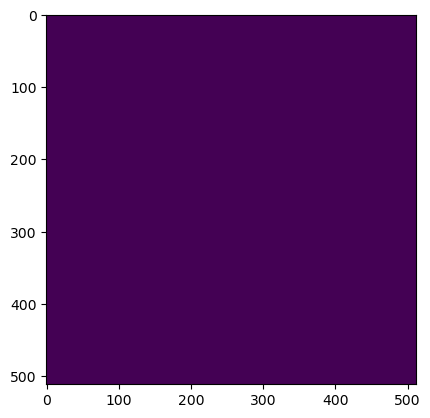

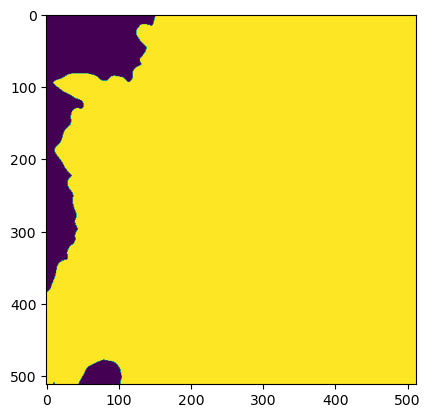

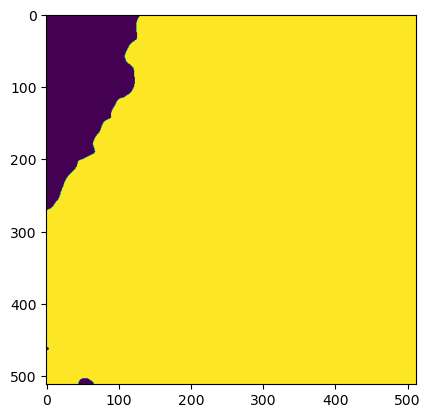

...

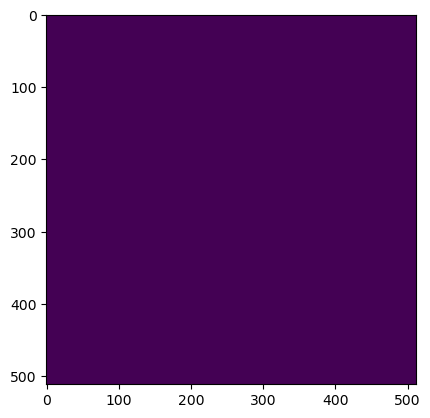

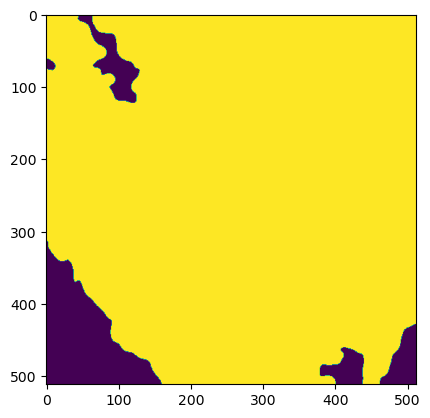

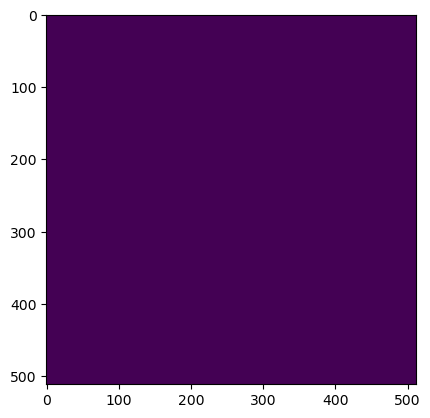

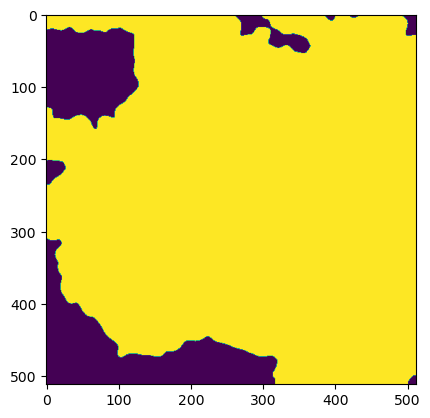

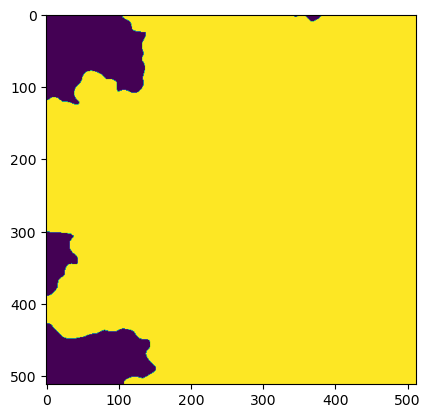

In [60]:
all_cell_masks = []

cell_mask_200804_AD_004 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_004/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell004_1s/Ch1/Detection/cellmask.tif'
cell_mask_200804_AD_005 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_005/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell005_1s/Ch1/Detection/cellmask.tif'
cell_mask_200804_AD_006 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_006/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell006_1s/Ch1/Detection/cellmask.tif'
cell_mask_200804_AD_007 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_007/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell007_1s/Ch1/Detection/cellmask.tif'
cell_mask_200804_AD_010 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_010/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell010_1s/Ch1/Detection/cellmask.tif'

all_cell_masks.append(cell_mask_200804_AD_004)
all_cell_masks.append(cell_mask_200804_AD_005)
all_cell_masks.append(cell_mask_200804_AD_006)
all_cell_masks.append(cell_mask_200804_AD_007)
all_cell_masks.append(cell_mask_200804_AD_010)

cell_mask_200804_ADA3_001 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_001/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell001AP2DNMN2_1s/Ch1/Detection/cellmask.tif'
cell_mask_200804_ADA3_002 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_002/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell002AP2DNMN2_1s/Ch1/Detection/cellmask.tif'
cell_mask_200804_ADA3_003 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_003/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell003AP2DNMN2_1s/Ch1/Detection/cellmask.tif'
cell_mask_200804_ADA3_008 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_008/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell008AP2DNMN2_1s/Ch1/Detection/cellmask.tif'
cell_mask_200804_ADA3_009 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_009/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell009AP2DNMN2_1s/Ch1/Detection/cellmask.tif'

all_cell_masks.append(cell_mask_200804_ADA3_001)
all_cell_masks.append(cell_mask_200804_ADA3_002)
all_cell_masks.append(cell_mask_200804_ADA3_003)
all_cell_masks.append(cell_mask_200804_ADA3_008)
all_cell_masks.append(cell_mask_200804_ADA3_009)

cell_mask_200819_AD_004 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_AD/split_channel_data/200819_AD_004/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADCell004_1s/Ch1/Detection/cellmask.tif'
cell_mask_200819_AD_005 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_AD/split_channel_data/200819_AD_005/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADCell005_1s/Ch1/Detection/cellmask.tif'
cell_mask_200819_AD_006 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_AD/split_channel_data/200819_AD_006/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADCell006_1s/Ch1/Detection/cellmask.tif'

all_cell_masks.append(cell_mask_200819_AD_004)
all_cell_masks.append(cell_mask_200819_AD_005)
all_cell_masks.append(cell_mask_200819_AD_006)

cell_mask_200819_ADA3_001 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_ADA3/split_channel_data/200819_ADA3_001/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADA3Cell001AP2DNMN2_1s/Ch1/Detection/cellmask.tif'
cell_mask_200819_ADA3_002 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_ADA3/split_channel_data/200819_ADA3_002/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADA3Cell002AP2DNMN2_1s/Ch1/Detection/cellmask.tif'
cell_mask_200819_ADA3_003 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_ADA3/split_channel_data/200819_ADA3_003/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADA3Cell003AP2DNMN2_1s/Ch1/Detection/cellmask.tif'

all_cell_masks.append(cell_mask_200819_ADA3_001)
all_cell_masks.append(cell_mask_200819_ADA3_002)
all_cell_masks.append(cell_mask_200819_ADA3_003)

cell_mask_200722_ADA3_001 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_001/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell001AP2DNMN2_1s/Ch1/Detection/cellmask.tif'
cell_mask_200722_ADA3_002 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_002/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell002AP2DNMN2_1s/Ch1/Detection/cellmask.tif'
cell_mask_200722_ADA3_003 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_003/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell003AP2DNMN2_1s/Ch1/Detection/cellmask.tif'
cell_mask_200722_ADA3_004 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_004/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell004AP2DNMN2_1s/Ch1/Detection/cellmask.tif'
cell_mask_200722_ADA3_005 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_005/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell005AP2DNMN2_1s/Ch1/Detection/cellmask.tif'

all_cell_masks.append(cell_mask_200722_ADA3_001)
all_cell_masks.append(cell_mask_200722_ADA3_002)
all_cell_masks.append(cell_mask_200722_ADA3_003)
all_cell_masks.append(cell_mask_200722_ADA3_004)
all_cell_masks.append(cell_mask_200722_ADA3_005)

for mask_sample in all_cell_masks:

    raw_image = imagecodecs.imread(mask_sample)

    plt.imshow(raw_image)
    plt.show()


# upload DNM2 channels and calculate area of colonies (some cmeAnalysis masks are blank)

The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.


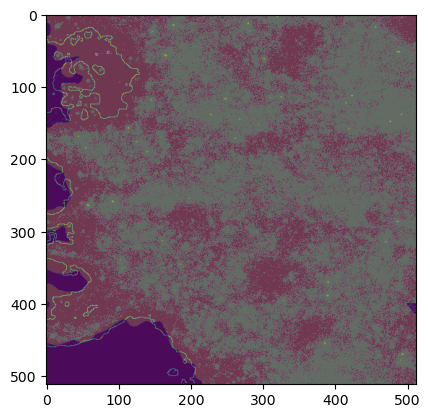

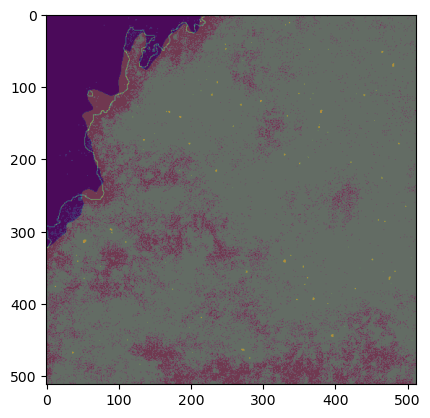

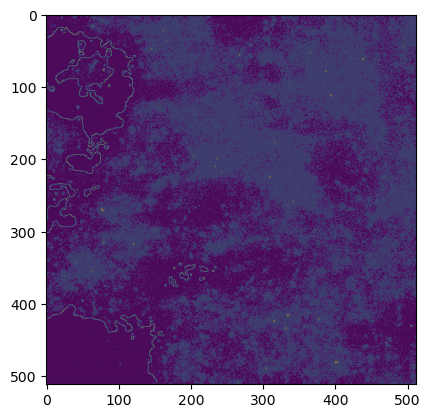

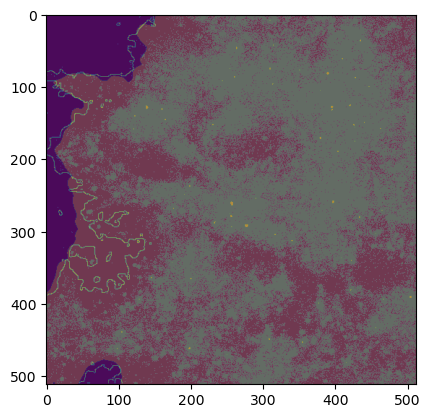

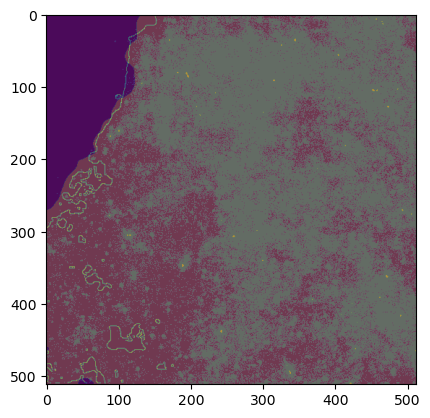

...

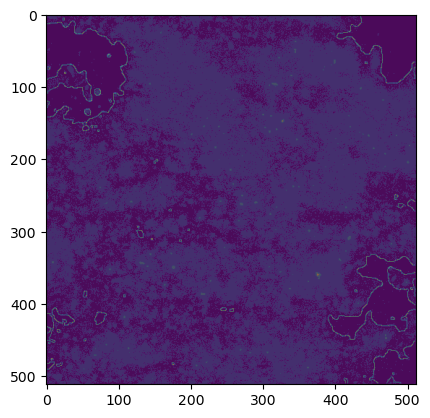

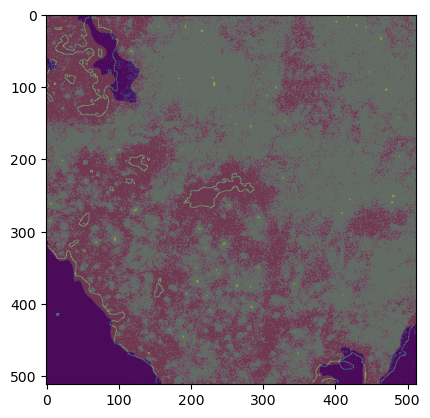

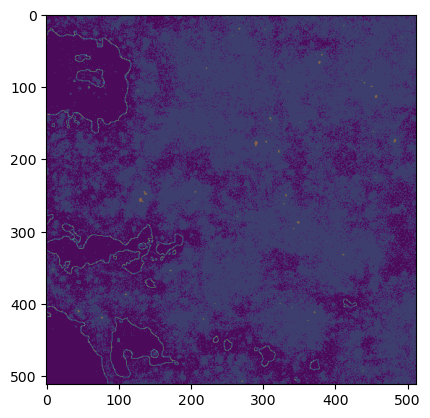

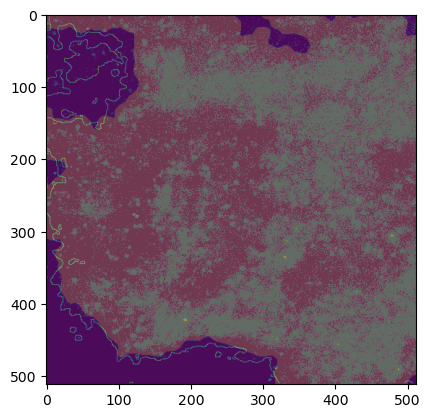

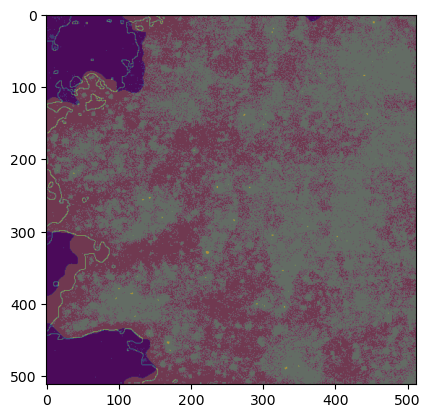

In [61]:
all_dnm2_channels = []

dnm2_200804_AD_004 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_004/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell004_1s/Ch2/200804ADCell004Ch2.tif'
dnm2_200804_AD_005 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_005/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell005_1s/Ch2/200804ADCell005Ch2.tif'
dnm2_200804_AD_006 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_006/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell006_1s/Ch2/200804ADCell006Ch2.tif'
dnm2_200804_AD_007 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_007/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell007_1s/Ch2/200804ADCell007Ch2.tif'
dnm2_200804_AD_010 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_010/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell010_1s/Ch2/200804ADCell010Ch2.tif'

all_dnm2_channels.append(dnm2_200804_AD_004)
all_dnm2_channels.append(dnm2_200804_AD_005)
all_dnm2_channels.append(dnm2_200804_AD_006)
all_dnm2_channels.append(dnm2_200804_AD_007)
all_dnm2_channels.append(dnm2_200804_AD_010)

dnm2_200804_ADA3_001 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_001/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell001AP2DNMN2_1s/Ch2/200804ADA3Cell001AP2DNMN2Ch2.tif'
dnm2_200804_ADA3_002 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_002/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell002AP2DNMN2_1s/Ch2/200804ADA3Cell002AP2DNMN2Ch2.tif'
dnm2_200804_ADA3_003 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_003/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell003AP2DNMN2_1s/Ch2/200804ADA3Cell003AP2DNMN2Ch2.tif'
dnm2_200804_ADA3_008 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_008/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell008AP2DNMN2_1s/Ch2/200804ADA3Cell008AP2DNMN2Ch2.tif'
dnm2_200804_ADA3_009 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_009/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell009AP2DNMN2_1s/Ch2/200804ADA3Cell009AP2DNMN2Ch2.tif'

all_dnm2_channels.append(dnm2_200804_ADA3_001)
all_dnm2_channels.append(dnm2_200804_ADA3_002)
all_dnm2_channels.append(dnm2_200804_ADA3_003)
all_dnm2_channels.append(dnm2_200804_ADA3_008)
all_dnm2_channels.append(dnm2_200804_ADA3_009)

dnm2_200819_AD_004 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_AD/split_channel_data/200819_AD_004/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADCell004_1s/Ch2/200819ADCell004Ch2.tif'
dnm2_200819_AD_005 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_AD/split_channel_data/200819_AD_005/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADCell005_1s/Ch2/200819ADCell005Ch2.tif'
dnm2_200819_AD_006 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_AD/split_channel_data/200819_AD_006/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADCell006_1s/Ch2/200819ADCell006Ch2.tif'

all_dnm2_channels.append(dnm2_200819_AD_004)
all_dnm2_channels.append(dnm2_200819_AD_005)
all_dnm2_channels.append(dnm2_200819_AD_006)

dnm2_200819_ADA3_001 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_ADA3/split_channel_data/200819_ADA3_001/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADA3Cell001AP2DNMN2_1s/Ch2/200819ADA3Cell001Ch2.tif'
dnm2_200819_ADA3_002 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_ADA3/split_channel_data/200819_ADA3_002/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADA3Cell002AP2DNMN2_1s/Ch2/200819ADA3Cell002Ch2.tif'
dnm2_200819_ADA3_003 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_ADA3/split_channel_data/200819_ADA3_003/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADA3Cell003AP2DNMN2_1s/Ch2/200819ADA3Cell003Ch2.tif'

all_dnm2_channels.append(dnm2_200819_ADA3_001)
all_dnm2_channels.append(dnm2_200819_ADA3_002)
all_dnm2_channels.append(dnm2_200819_ADA3_003)

dnm2_200722_ADA3_001 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_001/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell001AP2DNMN2_1s/Ch2/200722ADA3Cell001AP2DNM2Ch2.tif'
dnm2_200722_ADA3_002 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_002/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell002AP2DNMN2_1s/Ch2/200722ADA3Cell002AP2DNM2Ch2.tif'
dnm2_200722_ADA3_003 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_003/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell003AP2DNMN2_1s/Ch2/200722ADA3Cell003AP2DNM2Ch2.tif'
dnm2_200722_ADA3_004 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_004/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell004AP2DNMN2_1s/Ch2/200722ADA3Cell004AP2DNM2Ch2.tif'
dnm2_200722_ADA3_005 = '/Volumes/GoogleDrive/My Drive/Drubin Lab/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_005/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell005AP2DNMN2_1s/Ch2/200722ADA3Cell005AP2DNM2Ch2.tif'

all_dnm2_channels.append(dnm2_200722_ADA3_001)
all_dnm2_channels.append(dnm2_200722_ADA3_002)
all_dnm2_channels.append(dnm2_200722_ADA3_003)
all_dnm2_channels.append(dnm2_200722_ADA3_004)
all_dnm2_channels.append(dnm2_200722_ADA3_005)

all_cell_mask_cell_pixel_fraction = []

for i,mask_sample in enumerate(all_dnm2_channels):

    raw_image = io.imread(mask_sample)[0]
    grayscale_image = rgb2gray(raw_image)
    grayscale_image=median(grayscale_image,disk(5))
    percentile_threshold = np.percentile(grayscale_image.flatten(),10)
    edges = feature.canny(grayscale_image>percentile_threshold, sigma=1)

    plt.imshow(grayscale_image>percentile_threshold,alpha=0.08)
    plt.imshow(exposure.adjust_gamma(raw_image, 0.00001),alpha=0.9)
    plt.imshow(edges,alpha=0.5)
    plt.imshow(imagecodecs.imread(all_cell_masks[i]),alpha=0.2)

    plt.show()

    all_cell_mask_cell_pixel_fraction.append((grayscale_image>percentile_threshold).sum()/(512*512))

Text(0, 0.5, 'counts')

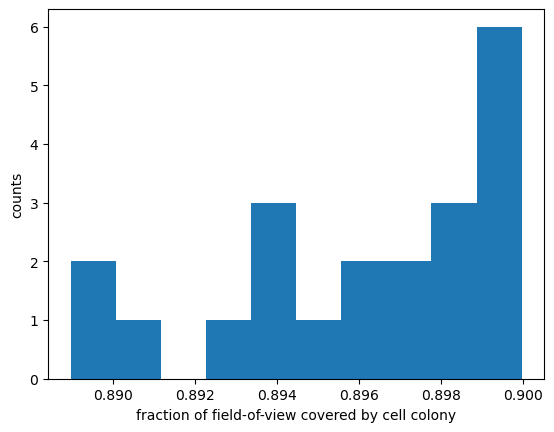

In [62]:
plt.hist(all_cell_mask_cell_pixel_fraction)
plt.xlabel('fraction of field-of-view covered by cell colony')
plt.ylabel('counts')

# measure frequency of intitiations of CCPs and all events category 1-8

In [63]:
index_dictionary = generate_index_dictionary.return_index_dictionary()

class_authenticCME_2color = np.array(merged_all_valid_tracks)[indices_2color_class_authenticCME]
class_authenticCME_3color = np.array(merged_all_valid_tracks)[indices_3color_class_authenticCME]

first_frame_of_track_class_authenticCME_2color = []

first_frame_of_track_class_authenticCME_3color = []

for i in range(len(class_authenticCME_2color)):

    first_frame_of_track_class_authenticCME_2color.append(class_authenticCME_2color[i][index_dictionary['index_frames']][0][0])

for i in range(len(class_authenticCME_3color)):

    first_frame_of_track_class_authenticCME_3color.append(class_authenticCME_3color[i][index_dictionary['index_frames']][0][0])

In [64]:
all_tracks = [] # a list of all the track objects; each value is one experiment
all_2_color_experiment_tracks = [] # all AP2/DNM2 tracks from 2 color cell line imaging
all_3_color_experiment_tracks = [] # all AP2/DNM2 tracks from 3 color cell line imaging


# this cell is for the following experiment set: 200804_AD
tracks_200804ADCell004_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_004/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell004_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200804ADCell005_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_005/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell005_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200804ADCell006_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_006/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell006_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200804ADCell007_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_007/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell007_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200804ADCell010_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_010/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell010_1s/Ch1/Tracking/ProcessedTracks.mat')

# add all the tracks to all_tracks
all_tracks.append(tracks_200804ADCell004_1s)
all_tracks.append(tracks_200804ADCell005_1s)
all_tracks.append(tracks_200804ADCell006_1s)
all_tracks.append(tracks_200804ADCell007_1s)
all_tracks.append(tracks_200804ADCell010_1s)

all_2_color_experiment_tracks.append(tracks_200804ADCell004_1s)
all_2_color_experiment_tracks.append(tracks_200804ADCell005_1s)
all_2_color_experiment_tracks.append(tracks_200804ADCell006_1s)
all_2_color_experiment_tracks.append(tracks_200804ADCell007_1s)
all_2_color_experiment_tracks.append(tracks_200804ADCell010_1s)


# this cell is for the following experiment set: 200819_AD
tracks_200819ADCell004_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_AD/split_channel_data/200819_AD_004/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADCell004_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200819ADCell005_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_AD/split_channel_data/200819_AD_005/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADCell005_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200819ADCell006_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_AD/split_channel_data/200819_AD_006/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADCell006_1s/Ch1/Tracking/ProcessedTracks.mat')

# add all the tracks to all_tracks
all_tracks.append(tracks_200819ADCell004_1s)
all_tracks.append(tracks_200819ADCell005_1s)
all_tracks.append(tracks_200819ADCell006_1s)

all_2_color_experiment_tracks.append(tracks_200819ADCell004_1s)
all_2_color_experiment_tracks.append(tracks_200819ADCell005_1s)
all_2_color_experiment_tracks.append(tracks_200819ADCell006_1s) 

# the following two cells are for 3 color movies, but only looking at the ap2dynm2 channels for now


# this cell is for the following experiment set: 200804_ADA3
tracks_200804ADA3Cell001_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_001/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell001AP2DNMN2_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200804ADA3Cell002_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_002/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell002AP2DNMN2_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200804ADA3Cell003_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_003/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell003AP2DNMN2_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200804ADA3Cell008_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_008/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell008AP2DNMN2_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200804ADA3Cell009_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_ADA3/split_channel_data/200804_ADA3_009/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADA3Cell009AP2DNMN2_1s/Ch1/Tracking/ProcessedTracks.mat')

all_tracks.append(tracks_200804ADA3Cell001_1s)
all_tracks.append(tracks_200804ADA3Cell002_1s)
all_tracks.append(tracks_200804ADA3Cell003_1s)
all_tracks.append(tracks_200804ADA3Cell008_1s)
all_tracks.append(tracks_200804ADA3Cell009_1s)

all_3_color_experiment_tracks.append(tracks_200804ADA3Cell001_1s)
all_3_color_experiment_tracks.append(tracks_200804ADA3Cell002_1s)
all_3_color_experiment_tracks.append(tracks_200804ADA3Cell003_1s)
all_3_color_experiment_tracks.append(tracks_200804ADA3Cell008_1s)
all_3_color_experiment_tracks.append(tracks_200804ADA3Cell009_1s)

# this cell is for the following experiment set: 200819_ADA3
tracks_200819ADA3Cell001_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_ADA3/split_channel_data/200819_ADA3_001/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADA3Cell001AP2DNMN2_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200819ADA3Cell002_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_ADA3/split_channel_data/200819_ADA3_002/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADA3Cell002AP2DNMN2_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200819ADA3Cell003_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_ADA3/split_channel_data/200819_ADA3_003/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADA3Cell003AP2DNMN2_1s/Ch1/Tracking/ProcessedTracks.mat')

all_tracks.append(tracks_200819ADA3Cell001_1s)
all_tracks.append(tracks_200819ADA3Cell002_1s)
all_tracks.append(tracks_200819ADA3Cell003_1s)

all_3_color_experiment_tracks.append(tracks_200819ADA3Cell001_1s)
all_3_color_experiment_tracks.append(tracks_200819ADA3Cell002_1s)
all_3_color_experiment_tracks.append(tracks_200819ADA3Cell003_1s)

tracks_200722CellADA3001_1s = display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_001/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell001AP2DNMN2_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200722CellADA3002_1s = display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_002/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell002AP2DNMN2_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200722CellADA3003_1s = display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_003/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell003AP2DNMN2_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200722CellADA3004_1s = display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_004/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell004AP2DNMN2_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200722CellADA3005_1s = display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200722_ADA3/split_channel_data/200722_ADA3_005/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200722ADA3Cell005AP2DNMN2_1s/Ch1/Tracking/ProcessedTracks.mat')

all_3_color_experiment_tracks.append(tracks_200722CellADA3001_1s)
all_3_color_experiment_tracks.append(tracks_200722CellADA3002_1s)
all_3_color_experiment_tracks.append(tracks_200722CellADA3003_1s)
all_3_color_experiment_tracks.append(tracks_200722CellADA3004_1s)
all_3_color_experiment_tracks.append(tracks_200722CellADA3005_1s)

In [65]:
# merge all 2 and 3 color cell line tracks into one track array each
merged_all_tracks_2_color = merge_tools.merge_experiments(all_2_color_experiment_tracks,[list(range(len(track_set))) for track_set in all_2_color_experiment_tracks])

merged_all_tracks_3_color = merge_tools.merge_experiments(all_3_color_experiment_tracks,[list(range(len(track_set))) for track_set in all_3_color_experiment_tracks])

In [66]:
len(merged_all_tracks_2_color), len(merged_all_tracks_3_color)

(121349, 196451)

# the frequency of initiation of CCPs and all detected events

In [67]:
%%capture
index_dictionary = generate_index_dictionary.return_index_dictionary()



first_frame_of_track_2_color = []

first_frame_of_track_3_color = []

for i in range(len(merged_all_tracks_2_color)):

    first_frame_of_track_2_color.append(merged_all_tracks_2_color[i][index_dictionary['index_frames']][0][0])

for i in range(len(merged_all_tracks_3_color)):

    first_frame_of_track_3_color.append(merged_all_tracks_3_color[i][index_dictionary['index_frames']][0][0])

plt.figure(dpi=500, figsize=(10,10))
plt.hist(first_frame_of_track_2_color, 
         color='r',
         bins='auto', 
         density=True,
         histtype='step', 
         cumulative=True, 
         label='all 2 color cell line events',
         alpha=0.4)

plt.hist(first_frame_of_track_3_color,
         color='b',
         bins='auto', 
         density=True, 
         histtype='step', 
         cumulative=True, 
         label='all 3 color cell line events',
         alpha=0.4)

plt.hist(first_frame_of_track_class_authenticCME_2color,
         color='r',
         bins='auto', 
         density=True, 
         histtype='step', 
         cumulative=True, 
         label='CCPs in 2 color cell line',
         alpha=1)

plt.hist(first_frame_of_track_class_authenticCME_3color,
         color='b',
         bins='auto', 
         density=True, 
         histtype='step', 
         cumulative=True, 
         label='CCPs in 3 color cell line',
         alpha=1)

plt.xlabel('frame track starts')
plt.ylabel('fraction of tracks started by Nth frame')
plt.legend(loc='upper left')
plt.title('total number of tracks- 2 color: ' + "{:,}".format(len(merged_all_tracks_2_color)) + ', 3 color: ' + "{:,}".format(len(merged_all_tracks_3_color)) +
          '\ntotal number of CCPs- 2 color: ' + "{:,}".format(len(first_frame_of_track_class_authenticCME_2color)) + ', 3 color: ' + "{:,}".format(len(first_frame_of_track_class_authenticCME_3color)))
plt.savefig(unique_user_saved_outputs+'/plots/all_event_initiation_over_frames_cdf.png')

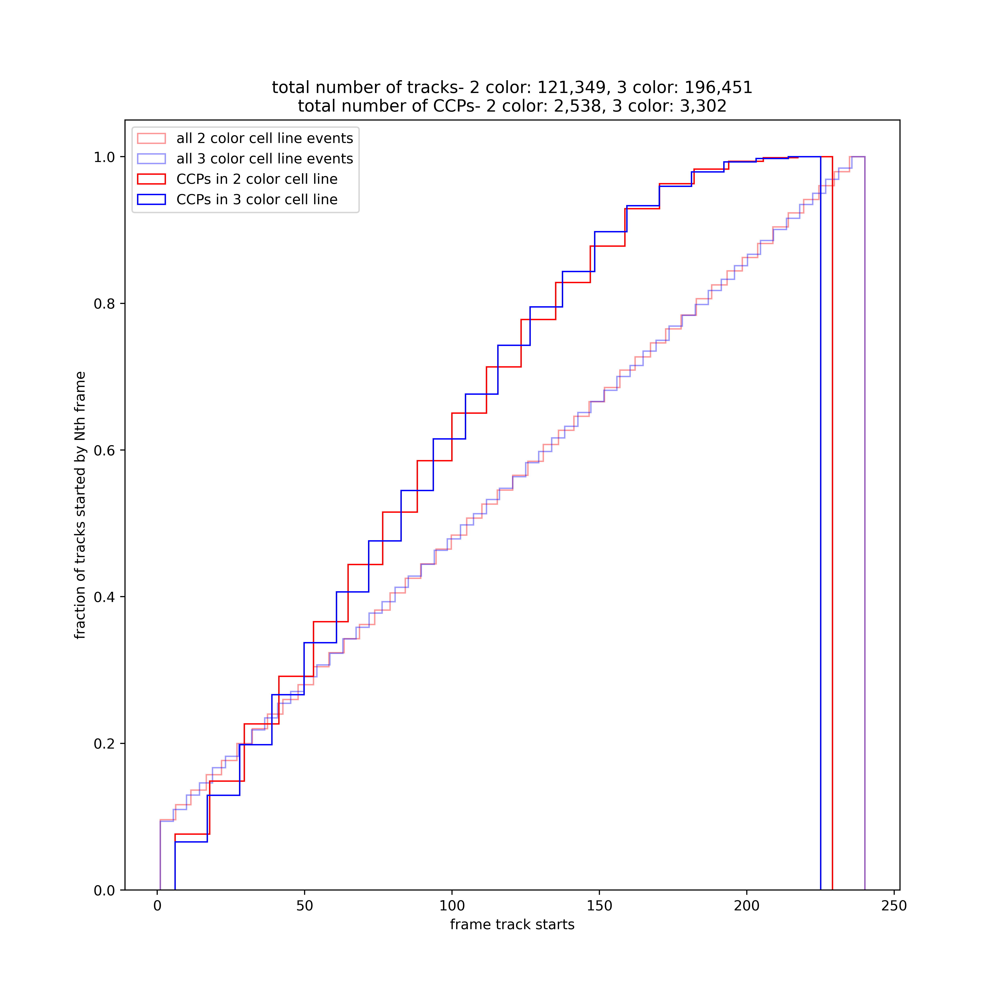

In [68]:
Image(filename=unique_user_saved_outputs+'/plots/all_event_initiation_over_frames_cdf.png', height=500, width=500)

# measure the relative distribution of mixture components across experiments

In [52]:
df_merged_features

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,kurtosis_dnm2,number_significant_dnm2,max_consecutive_significant_dnm2,fraction_significant_dnm2,fraction_peak_ap2,fraction_peak_dnm2,experiment_number,number_of_channels,date,cmeAnalysis_dynamin2_prediction
0,216.0,1796.284550,740.516756,7.203812,7.203812,2.630656,0.566262,0.725913,159.0,186.0,...,0.889904,167.0,43.0,0.738938,0.703540,0.823009,0.0,2.0,200804.0,1.0
1,201.0,2215.532695,1505.433273,17.220726,14.507135,3.797526,0.424574,0.912671,111.0,107.0,...,8.009901,115.0,89.0,0.545024,0.526066,0.507109,0.0,2.0,200804.0,1.0
2,201.0,864.976087,421.405691,17.621866,17.130473,3.472332,0.566588,0.776404,42.0,44.0,...,0.807456,167.0,70.0,0.791469,0.199052,0.208531,0.0,2.0,200804.0,1.0
3,192.0,509.795166,356.302521,10.804211,13.292842,5.888569,0.428736,1.058177,44.0,190.0,...,4.081995,112.0,57.0,0.554455,0.217822,0.940594,0.0,2.0,200804.0,1.0
4,188.0,1636.422386,883.606436,11.255090,7.793074,5.531006,0.415792,0.753372,174.0,169.0,...,2.885473,169.0,80.0,0.853535,0.878788,0.853535,0.0,2.0,200804.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
242502,2.0,28.054860,16.586818,2.083531,5.014688,4.483773,1.413195,2.791558,5.0,8.0,...,0.754018,0.0,0.0,0.000000,0.416667,0.666667,30.0,5.0,211227.0,0.0
242503,2.0,50.579412,8.441034,6.683116,2.285077,4.231456,1.775796,0.675348,5.0,1.0,...,0.441304,0.0,0.0,0.000000,0.416667,0.083333,30.0,5.0,211227.0,0.0
242504,2.0,46.818641,-1.983774,1.533790,2.409278,3.660411,1.399023,1.953524,6.0,4.0,...,-1.230884,0.0,0.0,0.000000,0.500000,0.333333,30.0,5.0,211227.0,0.0
242505,2.0,65.550032,6.285178,1.108563,0.463661,2.970810,1.573254,0.092735,6.0,11.0,...,-0.548510,0.0,0.0,0.000000,0.500000,0.916667,30.0,5.0,211227.0,0.0


In [53]:
for exp_num in range(8):

    indices_exp = df_merged_features[df_merged_features['experiment_number']==exp_num].index.values
    
    gmm_preds_exp = df_pcs_normal_scaled_with_gmm_cluster['gmm_predictions'][indices_exp].values

    print(len(gmm_preds_exp))

7510
7955
5950
7295
6746
7429
8426
7928


In [72]:
num_clusters = number_of_clusters

exp_number_label = []
cluster_label = []
fraction_cluster_label = []
cell_line_labels = []

for exp_num in range(len(set(df_merged_features['experiment_number']))):
    
    if exp_num<8 or exp_num>25:
        
        exp_number_label += [exp_num for _ in range(num_clusters)]
        cluster_label += list(range(num_clusters))



        cell_line_labels += [3 if exp_num>25 else 2 for _ in range(num_clusters)]

        indices_exp = df_merged_features[df_merged_features['experiment_number']==exp_num].index.values

        gmm_preds_exp = df_pcs_normal_scaled_with_gmm_cluster['gmm_predictions'][indices_exp].values

        for comp_num in range(num_clusters):

            fraction_cluster_label.append(len(np.nonzero(gmm_preds_exp==comp_num)[0])/len(gmm_preds_exp))

exp_number_label = np.array(exp_number_label).reshape(len(exp_number_label), -1)
cluster_label = np.array(cluster_label).reshape(len(exp_number_label), -1)
fraction_cluster_label = np.array(fraction_cluster_label).reshape(len(exp_number_label), -1)
cell_line_labels = np.array(cell_line_labels).reshape(len(exp_number_label), -1)

data_df = np.hstack((exp_number_label, cluster_label, fraction_cluster_label, cell_line_labels))
df_fraction_comps_between_experiments = pd.DataFrame(data=data_df, columns=['experiment_number', 'component_number', 'fraction', 'number_of_channels'])        

In [73]:
df_fraction_comps_between_experiments

,experiment_number,component_number,fraction,number_of_channels
0,0.0,0.0,0.088948,2.0
1,0.0,1.0,0.245672,2.0
2,0.0,2.0,0.112916,2.0
3,0.0,3.0,0.164581,2.0
4,0.0,4.0,0.387883,2.0
...,...,...,...,...
60,30.0,0.0,0.059375,3.0
61,30.0,1.0,0.290265,3.0
62,30.0,2.0,0.087287,3.0
63,30.0,3.0,0.207417,3.0


# measure the rate of events from all mixture components across every experiments

In [74]:
pvals = []
means_2_color = []
means_3_color = []

for cluster_num in range(num_clusters):
    
    df = df_fraction_comps_between_experiments
    two_color_indices = df[(df['number_of_channels']==2) & (df['component_number']==cluster_num)].index.values
    three_color_indices = df[(df['number_of_channels']==3) & (df['component_number']==cluster_num)].index.values
    
    fracs_2_color = df['fraction'][two_color_indices]
    fracs_3_color = df['fraction'][three_color_indices]
    
    means_2_color.append(np.mean(fracs_2_color))
    means_3_color.append(np.mean(fracs_3_color))
    pvals.append(stats.ttest_ind(fracs_2_color, fracs_3_color, equal_var=False)[1])
    
max_fraction_each_cluster = []
min_fraction_each_cluster = []

df = df_fraction_comps_between_experiments

for i in range(num_clusters):
    
    max_fraction_each_cluster.append(np.max(df[df['component_number']==i].values[:,2]))
    min_fraction_each_cluster.append(np.min(df[df['component_number']==i].values[:,2]))

In [75]:
three_color_indices

array([44, 49, 54, 59, 64])

In [76]:
means_2_color, fracs_3_color

([0.10132941229796738,
  0.24514382444489108,
  0.10449484531274943,
  0.1703185863750361,
  0.37871333156935594],
 44    0.377035
 49    0.333458
 54    0.333536
 59    0.350689
 64    0.355656
 Name: fraction, dtype: float64)

(0.0, 0.5)

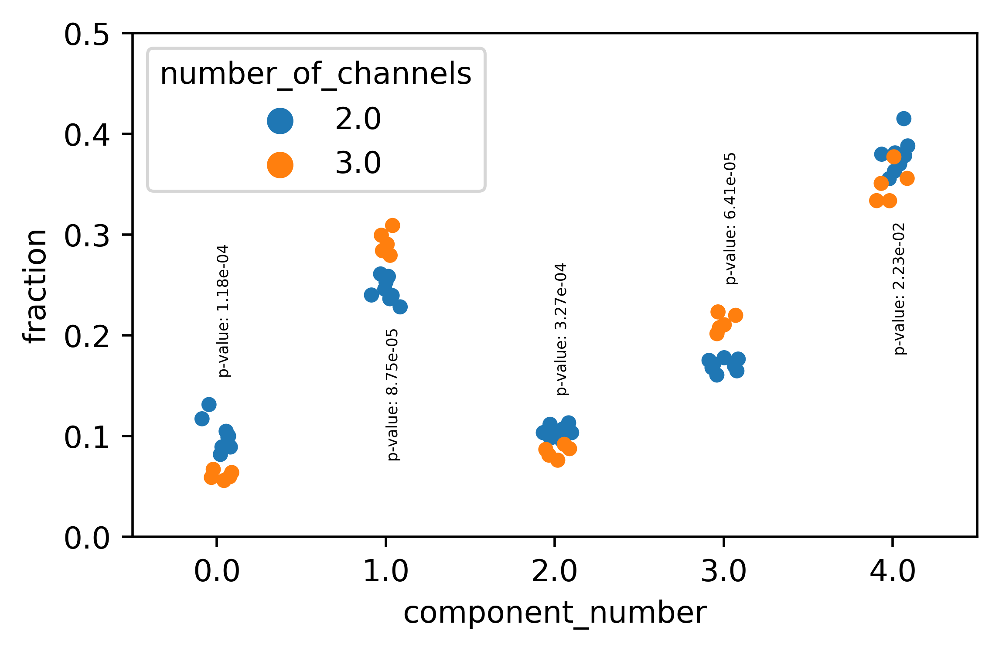

In [77]:
# %%capture
plt.style.use('default')
plt.rcParams['figure.figsize']=(5,3)
plt.rcParams['figure.dpi']=500
sns.stripplot(data=df_fraction_comps_between_experiments, x='component_number', y='fraction', hue='number_of_channels')

matrix_vals = df_fraction_comps_between_experiments.values

for i, pval in enumerate(pvals):
    
    if i not in [1,4]:
        
        plt.text(i, max_fraction_each_cluster[i]+0.03, 'p-value: ' + "{:.2e}".format(pval), rotation=90, size=5)   

    else:
        
        plt.text(i, min_fraction_each_cluster[i]-0.15, 'p-value: ' + "{:.2e}".format(pval), rotation=90, size=5)   
plt.ylim(0,0.5)
# plt.savefig(unique_user_saved_outputs+'/plots/proportions_gmm_clusters_between_experiments_hue_cellline.png', bbox_inches='tight')

In [87]:
df = df_merged_features
    
indices_2 = df[df['number_of_channels']==2].index.values
indices_5 = df[df['number_of_channels']==5].index.values

[Text(0, 0, '-5'), Text(0, 0, '0'), Text(0, 0, '5'), Text(0, 0, '10')]

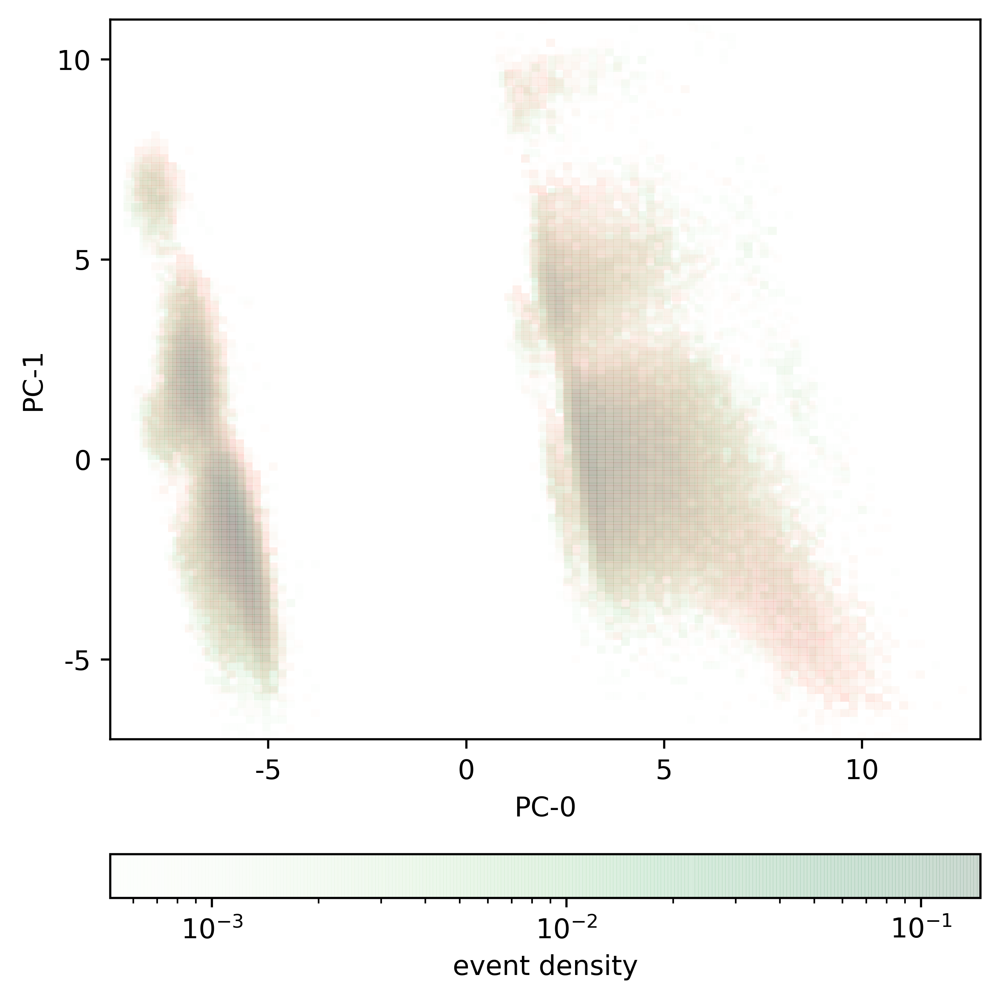

In [93]:
plt.style.use('default')
fig, ax = plt.subplots(1,1, constrained_layout=True, figsize=(5,5), dpi=500)
sc = ax.hist2d(df_pcs_normal_scaled_with_gmm_cluster['PC-0'][indices_2],
            df_pcs_normal_scaled_with_gmm_cluster['PC-1'][indices_2], 
            bins=100,
             norm=mpl.colors.LogNorm(),
             alpha=0.2,
             density=True,
             cmap='Reds')
sc = ax.hist2d(df_pcs_normal_scaled_with_gmm_cluster['PC-0'][indices_5],
            df_pcs_normal_scaled_with_gmm_cluster['PC-1'][indices_5], 
            bins=100,
             norm=mpl.colors.LogNorm(),
             alpha=0.2,
             density=True,
             cmap='Greens')
cba = fig.colorbar(sc[3], ax=ax, location='bottom')
cba.set_label('event density', rotation=0)


ax.set_xlabel('PC-0')
ax.set_ylabel('PC-1')

ax.set_ylim([-7, 11])
ax.set_xlim([-9, 13])
ax.set_xticks([-5, 0, 5, 10])
ax.set_xticklabels([-5, 0, 5, 10])
ax.set_yticks([-5, 0, 5, 10])
ax.set_yticklabels([-5, 0, 5, 10])

In [58]:
# Image(filename=unique_user_saved_outputs+'/plots/proportions_gmm_clusters_between_experiments_hue_cellline.png', height=500, width=500)

# measure the rate of events from all mixture components across every experiments

In [75]:
num_clusters = number_of_clusters

normalization_factor = .108*.108*512*512 * 4 #  per microns^2 and per 4 minutes

exp_number_label = []
cluster_label = []
rate_label = []
cell_line_labels = []

for exp_num in range(len(set(df_merged_features['experiment_number']))):
    
    exp_number_label += [exp_num for _ in range(num_clusters)]
    cluster_label += list(range(num_clusters)) 
        
    cell_line_labels += [3 if exp_num > 7 else 2 for _ in range(num_clusters)]
    
    indices_exp = df_merged_features[df_merged_features['experiment_number']==exp_num].index.values
    
    gmm_preds_exp = df_pcs_normal_scaled_with_gmm_cluster['gmm_predictions'][indices_exp].values
    
    for comp_num in range(num_clusters):
        
        rate_label.append(len(np.nonzero(gmm_preds_exp==comp_num)[0])/(all_cell_mask_cell_pixel_fraction[exp_num-1]*normalization_factor))
        
exp_number_label = np.array(exp_number_label).reshape(len(exp_number_label), -1)
cluster_label = np.array(cluster_label).reshape(len(exp_number_label), -1)
rate_label = np.array(rate_label).reshape(len(exp_number_label), -1)
cell_line_labels = np.array(cell_line_labels).reshape(len(exp_number_label), -1)

data_df = np.hstack((exp_number_label, cluster_label, rate_label, cell_line_labels))
df_initiation_comps_between_experiments = pd.DataFrame(data=data_df, columns=['experiment_number', 'component_number', 'rate', 'number_of_channels'])        

# measure difference in cluster initiations between cell lines

In [76]:
pvals = []
means_2_color = []
means_3_color = []

for cluster_num in range(num_clusters):
    
    df = df_initiation_comps_between_experiments
    two_color_indices = df[(df['number_of_channels']==2) & (df['component_number']==cluster_num)].index.values
    three_color_indices = df[(df['number_of_channels']==3) & (df['component_number']==cluster_num)].index.values
    
    rates_2_color = df['rate'][two_color_indices]
    rates_3_color = df['rate'][three_color_indices]
    
    means_2_color.append(np.mean(rates_2_color))
    means_3_color.append(np.mean(rates_3_color))
    
    pvals.append(stats.ttest_ind(rates_2_color, rates_3_color, equal_var=False)[1])
    
max_fraction_each_cluster = []
min_fraction_each_cluster = []

df = df_initiation_comps_between_experiments

for i in range(num_clusters):
    
    max_fraction_each_cluster.append(np.max(df[df['component_number']==i].values[:,2]))
    min_fraction_each_cluster.append(np.min(df[df['component_number']==i].values[:,2]))

In [77]:
%%capture
plt.style.use('default')
plt.rcParams['figure.figsize']=(5,4)
plt.rcParams['figure.dpi']=500
fig, ax = plt.subplots(1,1) 

g = sns.stripplot(data=df_initiation_comps_between_experiments, x='component_number', y='rate', hue='number_of_channels', ax=ax)

for i, pval in enumerate(pvals):
    
    if i not in [1,4]:
        
        plt.text(i, max_fraction_each_cluster[i]+0.008, 'p-value: ' + "{:.2e}".format(pval), rotation=90, size=5)   

    else:
        
        plt.text(i, min_fraction_each_cluster[i]-0.08, 'p-value: ' + "{:.2e}".format(pval), rotation=90, size=5)   
        
ax.set_xlabel('GMM component')
ax.set_ylabel('rate (# events/microns^2/minutes)')
plt.ylim(0,0.5)
plt.savefig(unique_user_saved_outputs+'/plots/gmm_clusters_event_rates_between_experiments_hue_cellline.png')

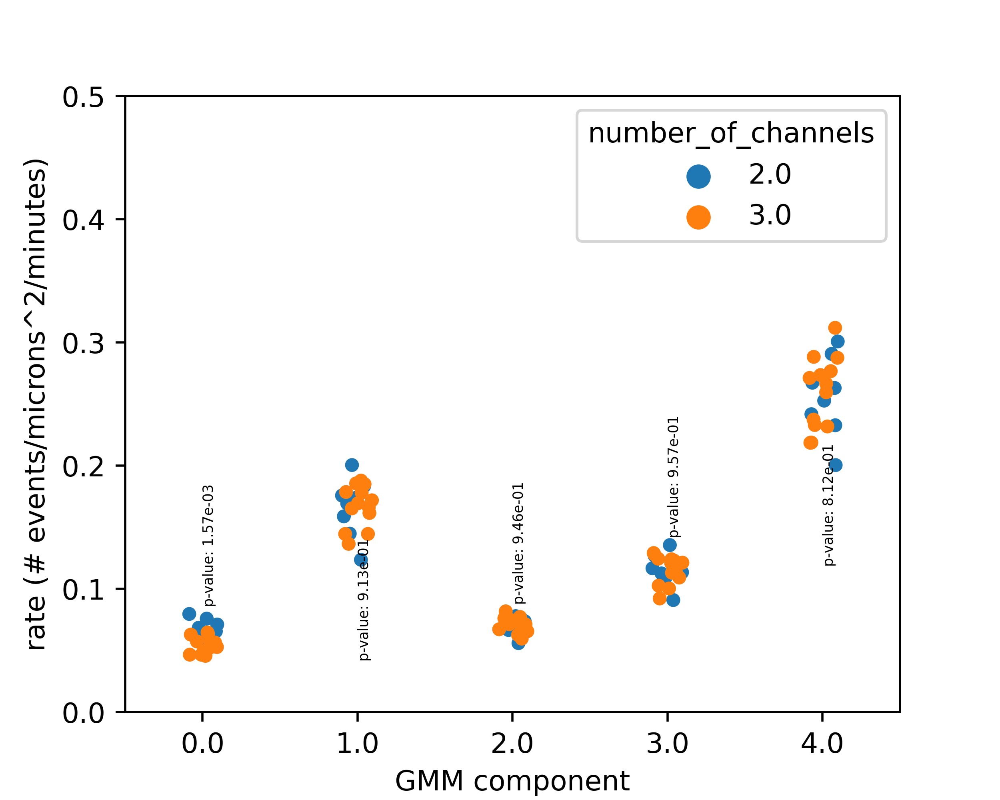

In [78]:
Image(filename=unique_user_saved_outputs+'/plots/gmm_clusters_event_rates_between_experiments_hue_cellline.png', height=500, width=500)

In [79]:
num_dnm2_positive_events_gmm_per_exp = []

for i in range(len(set(df_merged_features['experiment_number']))):

    indices_exp = list(set(list(df_merged_features.loc[df_merged_features['experiment_number']==i].index)) & 
                       set(list(df_pcs_normal_scaled_with_gmm_cluster.loc[df_pcs_normal_scaled_with_gmm_cluster['gmm_predictions']==index_DNM2positive].index)))
    
    num_dnm2_positive_events_gmm_per_exp.append(len(indices_exp))

In [80]:
ccp_nums = []
hotspot_nums = []

for i in range(len(set(df_merged_features['experiment_number']))):
    
    ccp_nums.append(len(ccp_events_per_experiment_all[i]))
    hotspot_nums.append(len(hotspot_events_per_experiment_all[i]))

In [81]:
len(ccp_events_per_experiment_all), len(hotspot_events_per_experiment_all), len(num_dnm2_positive_events_gmm_per_exp), len(all_cell_mask_cell_pixel_fraction)

(21, 21, 21, 21)

In [82]:
normalization_factor = .108*.108*512*512 * 4 #  per microns^2 and per 4 minutes
initiation_rates_ccps = [len(ccp_events_per_experiment_all[i])/(all_cell_mask_cell_pixel_fraction[i]*normalization_factor) for i in range(len(set(df_merged_features['experiment_number'])))]
initiation_rates_hotspots = [len(hotspot_events_per_experiment_all[i])/(all_cell_mask_cell_pixel_fraction[i]*normalization_factor) for i in range(len(set(df_merged_features['experiment_number'])))]
initiation_rates_all_dnm2 = [num_dnm2_positive_events_gmm_per_exp[i]/(all_cell_mask_cell_pixel_fraction[i]*normalization_factor) for i in range(len(set(df_merged_features['experiment_number'])))]

# calculate initiation rates between 2 cell lines

In [83]:
number_of_channels = [2 if i<8 else 3 for i in range(len(set(df_merged_features['experiment_number'])))]
initiation_data = np.vstack((np.array(initiation_rates_all_dnm2),
                             np.array(initiation_rates_ccps),
                             np.array(initiation_rates_hotspots),
                             np.array(number_of_channels))).T
df_initiations = pd.DataFrame(data=initiation_data, columns=['all','ccps','hotspots','num_channels'])

In [84]:
%%capture
plt.rcParams['figure.dpi']=500
plt.rcParams['figure.figsize']=(5,5)
fig, ax = plt.subplots(1,1) 

init2_color = initiation_rates_ccps[0:8]
init3_color = initiation_rates_ccps[8:]
avg_init2color = np.mean(init2_color)
avg_init3color = np.mean(init3_color)
plt.axhline(avg_init2color, xmin=0.15, xmax=0.35, color='black')
plt.axhline(avg_init3color, xmin=0.65, xmax=0.85, color='black')

g = sns.stripplot(x="num_channels", y="ccps", data=df_initiations, ax=ax)
ax.set_xlabel('cell line tags')
ax.set_xticklabels(['AP2/DNM2','AP2/DNM2/ARPC3'])
ax.set_ylabel('rate (# events/microns^2/minutes)')
pval = stats.ttest_ind(initiation_rates_ccps[0:8],initiation_rates_ccps[8:],equal_var=False)[1]
ax.set_ylim(bottom=0, top=1.1*np.max(initiation_rates_ccps))
ax.set_title("rate of CCP events\np-value of Welch's t-test: " + 
             "{:.2e}".format(pval) + 
          '\ntotal number of CCPs- 2 color: ' + "{:,}".format(len(maxintch1_2color_class_authenticCME)) + 
          ', 3 color: ' + "{:,}".format(len(maxintch1_3color_class_authenticCME)) +
             '\n each data point is a separate field-of-view')
plt.ylim(0,0.05)
plt.tight_layout()
plt.savefig(unique_user_saved_outputs+'/plots/ccp_initiation_per_exp_celllinecomp.png')

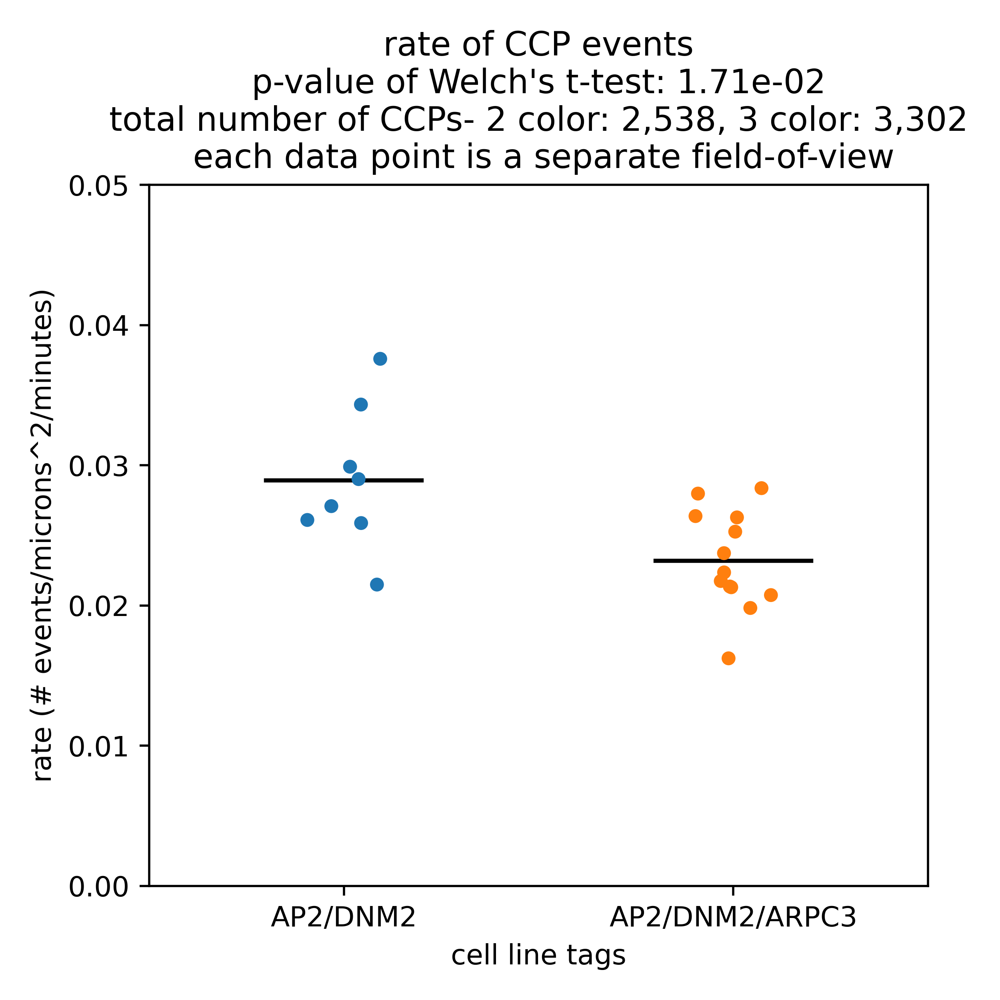

In [85]:
Image(filename=unique_user_saved_outputs+'/plots/ccp_initiation_per_exp_celllinecomp.png', height=500, width=500)

In [86]:
%%capture
plt.rcParams['figure.dpi']=500
plt.rcParams['figure.figsize']=(5,5)
fig, ax = plt.subplots(1,1) 
g = sns.stripplot(x="num_channels", y="all", data=df_initiations, ax=ax)
ax.set_xlabel('cell line tags')
ax.set_xticklabels(['AP2/DNM2','AP2/DNM2/ARPC3'])
ax.set_ylabel('rate (# events/microns^2/minutes)')
pval = stats.ttest_ind(initiation_rates_all_dnm2[0:8],initiation_rates_all_dnm2[8:],equal_var=False)[1]
ax.set_ylim(bottom=0, top=1.1*np.max(initiation_rates_all_dnm2))
ax.set_title("rate of DNM2 positive events\np-value of Welch's t-test: " + 
             "{:.2e}".format(pval) + 
             '\n each data point is a separate field-of-view')
plt.savefig(unique_user_saved_outputs+'/plots/dnm2plus_initiation_per_exp_celllinecomp.png')

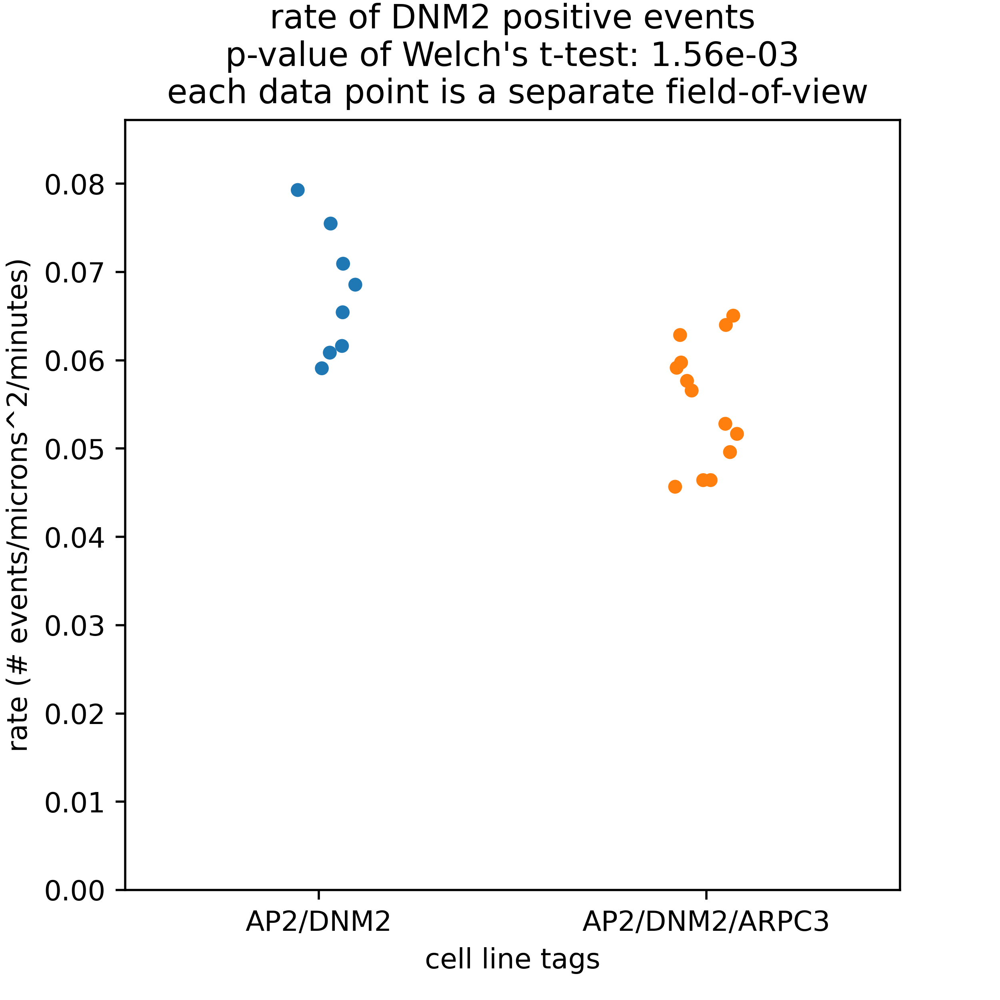

In [87]:
Image(filename=unique_user_saved_outputs+'/plots/dnm2plus_initiation_per_exp_celllinecomp.png', height=500, width=500)

In [105]:
colors = ['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8','C8','C8','C8','C8'] # color labeles

In [106]:
df_merged_features

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,kurtosis_dnm2,number_significant_dnm2,max_consecutive_significant_dnm2,fraction_significant_dnm2,fraction_peak_ap2,fraction_peak_dnm2,experiment_number,number_of_channels,date,cmeAnalysis_dynamin2_prediction
0,216.0,1796.284550,740.516756,7.203812,7.203812,2.630656,0.566262,0.725913,159.0,186.0,...,0.889904,167.0,43.0,0.738938,0.703540,0.823009,0.0,2.0,200804.0,1.0
1,201.0,2215.532695,1505.433273,17.220726,14.507135,3.797526,0.424574,0.912671,111.0,107.0,...,8.009901,115.0,89.0,0.545024,0.526066,0.507109,0.0,2.0,200804.0,1.0
2,201.0,864.976087,421.405691,17.621866,17.130473,3.472332,0.566588,0.776404,42.0,44.0,...,0.807456,167.0,70.0,0.791469,0.199052,0.208531,0.0,2.0,200804.0,1.0
3,192.0,509.795166,356.302521,10.804211,13.292842,5.888569,0.428736,1.058177,44.0,190.0,...,4.081995,112.0,57.0,0.554455,0.217822,0.940594,0.0,2.0,200804.0,1.0
4,188.0,1636.422386,883.606436,11.255090,7.793074,5.531006,0.415792,0.753372,174.0,169.0,...,2.885473,169.0,80.0,0.853535,0.878788,0.853535,0.0,2.0,200804.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
242502,2.0,28.054860,16.586818,2.083531,5.014688,4.483773,1.413195,2.791558,5.0,8.0,...,0.754018,0.0,0.0,0.000000,0.416667,0.666667,30.0,5.0,211227.0,0.0
242503,2.0,50.579412,8.441034,6.683116,2.285077,4.231456,1.775796,0.675348,5.0,1.0,...,0.441304,0.0,0.0,0.000000,0.416667,0.083333,30.0,5.0,211227.0,0.0
242504,2.0,46.818641,-1.983774,1.533790,2.409278,3.660411,1.399023,1.953524,6.0,4.0,...,-1.230884,0.0,0.0,0.000000,0.500000,0.333333,30.0,5.0,211227.0,0.0
242505,2.0,65.550032,6.285178,1.108563,0.463661,2.970810,1.573254,0.092735,6.0,11.0,...,-0.548510,0.0,0.0,0.000000,0.500000,0.916667,30.0,5.0,211227.0,0.0


In [97]:
len(merged_all_valid_tracks)

242507

In [101]:
all_tracks = [] # a list of all the track objects; each value is one experiment
all_2_color_experiment_tracks = [] # all AP2/DNM2 tracks from 2 color cell line imaging

# this cell is for the following experiment set: 200804_AD
tracks_200804ADCell004_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_004/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell004_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200804ADCell005_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_005/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell005_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200804ADCell006_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_006/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell006_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200804ADCell007_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_007/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell007_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200804ADCell010_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200804_AD/split_channel_data/200804_AD_010/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200804ADCell010_1s/Ch1/Tracking/ProcessedTracks.mat')

# add all the tracks to all_tracks
all_tracks.append(tracks_200804ADCell004_1s)
all_tracks.append(tracks_200804ADCell005_1s)
all_tracks.append(tracks_200804ADCell006_1s)
all_tracks.append(tracks_200804ADCell007_1s)
all_tracks.append(tracks_200804ADCell010_1s)

all_2_color_experiment_tracks.append(tracks_200804ADCell004_1s)
all_2_color_experiment_tracks.append(tracks_200804ADCell005_1s)
all_2_color_experiment_tracks.append(tracks_200804ADCell006_1s)
all_2_color_experiment_tracks.append(tracks_200804ADCell007_1s)
all_2_color_experiment_tracks.append(tracks_200804ADCell010_1s)


# this cell is for the following experiment set: 200819_AD
tracks_200819ADCell004_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_AD/split_channel_data/200819_AD_004/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADCell004_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200819ADCell005_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_AD/split_channel_data/200819_AD_005/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADCell005_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_200819ADCell006_1s=display_tracks.load_tracks(unique_user_path_tracks + '/ap2dynm2arcp3_project/TIRF movies revised/tracking_data_test_cyna/200819_AD/split_channel_data/200819_AD_006/tracking_settings_gaussian_psf_model_trackinggaplength_2_trackingradius_3_6/200819ADCell006_1s/Ch1/Tracking/ProcessedTracks.mat')

# add all the tracks to all_tracks
all_tracks.append(tracks_200819ADCell004_1s)
all_tracks.append(tracks_200819ADCell005_1s)
all_tracks.append(tracks_200819ADCell006_1s)

all_2_color_experiment_tracks.append(tracks_200819ADCell004_1s)
all_2_color_experiment_tracks.append(tracks_200819ADCell005_1s)
all_2_color_experiment_tracks.append(tracks_200819ADCell006_1s) 


# this cell is for the following experiment set: following shock
tracks_Cell1after_1s=display_tracks.load_tracks('/Users/cynashirazinejad/Desktop/shock_data/sorted_split_data/Cell1after_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_Cell2after_1s=display_tracks.load_tracks('/Users/cynashirazinejad/Desktop/shock_data/sorted_split_data/Cell2after_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_Cell3after_1s=display_tracks.load_tracks('/Users/cynashirazinejad/Desktop/shock_data/sorted_split_data/Cell3after_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_Cell4after_1s=display_tracks.load_tracks('/Users/cynashirazinejad/Desktop/shock_data/sorted_split_data/Cell4after_1s/Ch1/Tracking/ProcessedTracks.mat')
tracks_Cell5after_1s=display_tracks.load_tracks('/Users/cynashirazinejad/Desktop/shock_data/sorted_split_data/Cell5after_1s/Ch1/Tracking/ProcessedTracks.mat')

all_tracks.append(tracks_Cell1after_1s)
all_tracks.append(tracks_Cell2after_1s)
all_tracks.append(tracks_Cell3after_1s)
all_tracks.append(tracks_Cell4after_1s)
all_tracks.append(tracks_Cell5after_1s)

In [102]:
# all_tracks = []
# df = df_merged_features
# for exp_num in range(len(set(df_merged_features['experiment_number']))):
    
#     indices_exp = df[df['experiment_number']==exp_num].index.values
    
#     all_tracks.append(merged_all_valid_tracks[])


In [107]:
# %%capture 
# gather the event category (1-8) frequencies
category_frequencies = []
color_coded_frequencies = []
num_events_category = []
for j, track_set in enumerate(all_tracks):

    num_tracks_exp = len(track_set)
    
    for i in range(1,9): # track categories available

        tracks_category_i_exp = display_tracks.remove_tracks_by_criteria(track_set, track_category=[i])
        num_tracks_cat_i_exp = len(tracks_category_i_exp)
        category_frequencies.append([i, num_tracks_cat_i_exp/num_tracks_exp])
        color_coded_frequencies.append(colors[j])
        num_events_category.append([i, num_tracks_cat_i_exp])

The number of tracks returned: 7510

The number of tracks returned: 4713

The number of tracks returned: 2293

The number of tracks returned: 65

The number of tracks returned: 171

The number of tracks returned: 202

The number of tracks returned: 309

The number of tracks returned: 18

The number of tracks returned: 7955

The number of tracks returned: 5172

The number of tracks returned: 2231

The number of tracks returned: 31

The number of tracks returned: 175

The number of tracks returned: 262

The number of tracks returned: 358

The number of tracks returned: 18

The number of tracks returned: 5950

The number of tracks returned: 4357

The number of tracks returned: 2213

The number of tracks returned: 82

The number of tracks returned: 156

The number of tracks returned: 174

The number of tracks returned: 299

The number of tracks returned: 35

The number of tracks returned: 7295

The number of tracks returned: 4400

The number of tracks returned: 2168

The number of tracks r

([<matplotlib.axis.XTick at 0x7fde574c03c8>,
 [Text(0.0, 0, '1'),
  Text(2.0, 0, '2'),
  Text(4.0, 0, '3'),
  Text(6.0, 0, '4'),
  Text(8.0, 0, '5'),
  Text(10.0, 0, '6'),
  Text(0, 0, '7'),
  Text(0, 0, '8')])

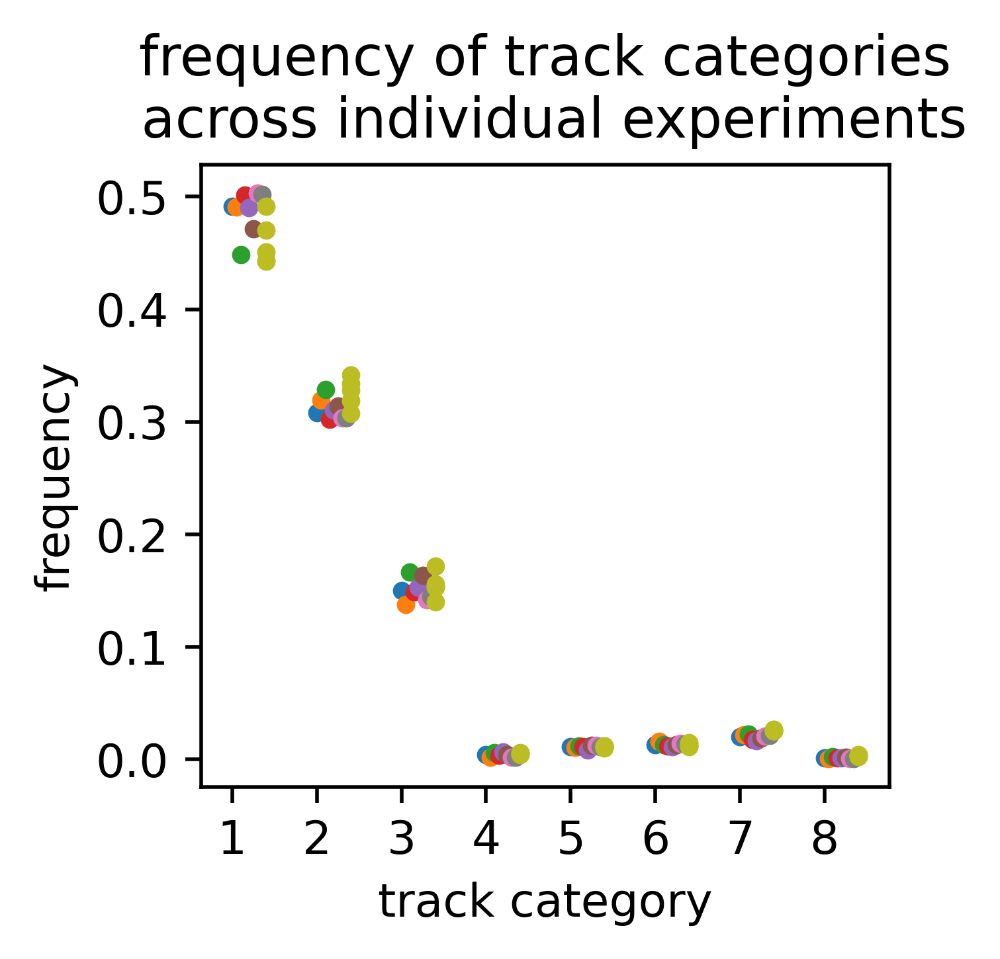

In [108]:
# %%capture
plt.figure(dpi=500, figsize=(3,3))
for i in range(len(category_frequencies)):
    color = color_coded_frequencies[i]
    
    plt.plot(category_frequencies[i][0]+colors.index(color)*0.05, category_frequencies[i][1], '.', color=color)

plt.xlabel('track category')
plt.ylabel('frequency')
plt.title('frequency of track categories\n across individual experiments')
plt.tight_layout()
plt.xticks(np.arange(1,9), labels=np.arange(1,9))
# plt.savefig(unique_user_saved_outputs+'/plots/frequencies_categories.png')

([<matplotlib.axis.XTick at 0x7fde01112550>,
 [Text(0.0, 0, '1'),
  Text(2.0, 0, '2'),
  Text(4.0, 0, '3'),
  Text(6.0, 0, '4'),
  Text(8.0, 0, '5'),
  Text(10.0, 0, '6'),
  Text(0, 0, '7'),
  Text(0, 0, '8')])

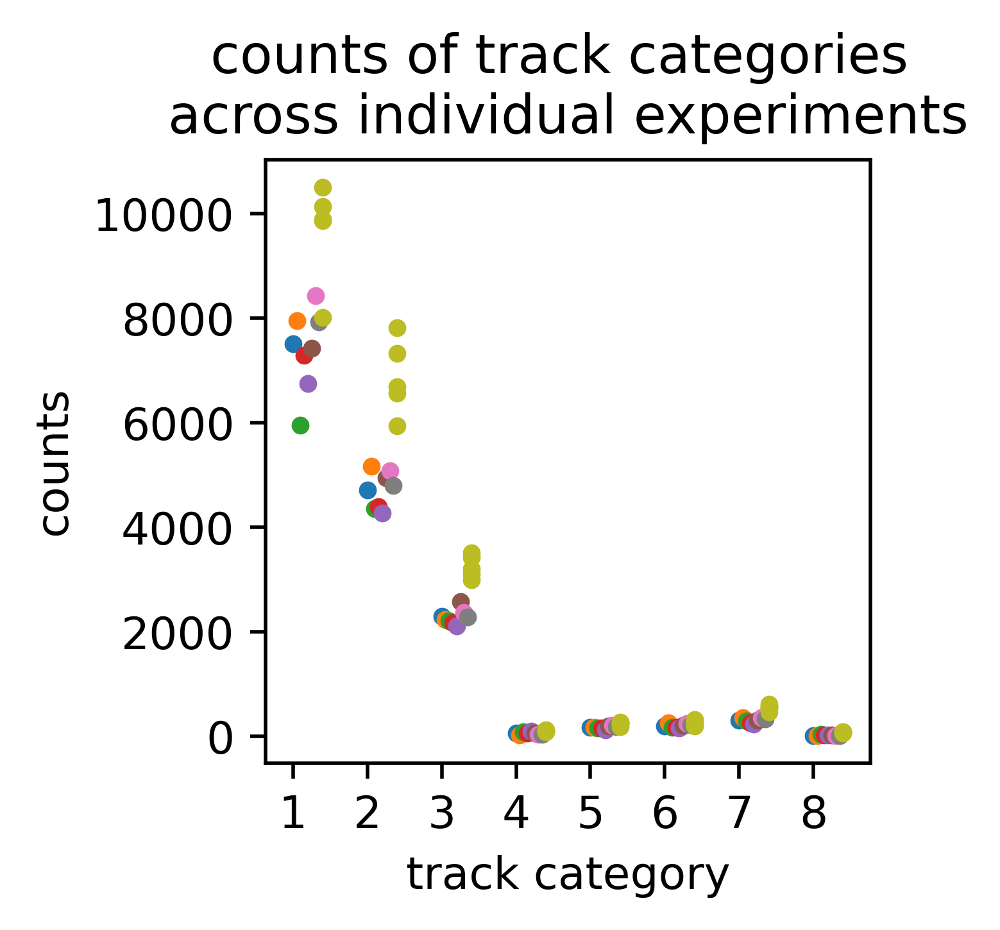

In [109]:
# %%capture
plt.figure(dpi=500, figsize=(3,3))
for i in range(len(num_events_category)):
    color = color_coded_frequencies[i]
    
    plt.plot(category_frequencies[i][0]+colors.index(color)*0.05, num_events_category[i][1], '.', color=color)
    
plt.xlabel('track category')
plt.ylabel('counts')
plt.title('counts of track categories \nacross individual experiments')
plt.tight_layout()
plt.xticks(np.arange(1,9), labels=np.arange(1,9))
# plt.savefig(unique_user_saved_outputs+'/plots/counts_categories.png')

In [110]:
index_dictionary = generate_index_dictionary.return_index_dictionary() # get indices of features in ProcessedTracks

In [112]:
x_std = [[] for i in range(13)] # get the width of the fits of the puncta to a normal distribution

for j, track_set in enumerate(all_tracks):
    
    for i in range(len(track_set)):
        if track_set[i][index_dictionary['index_catIdx']][0][0]==1:
            xstd_temp = track_set[i][index_dictionary['index_x_pos_pstd']][0]
            for std in xstd_temp:
                x_std[j].append(std)

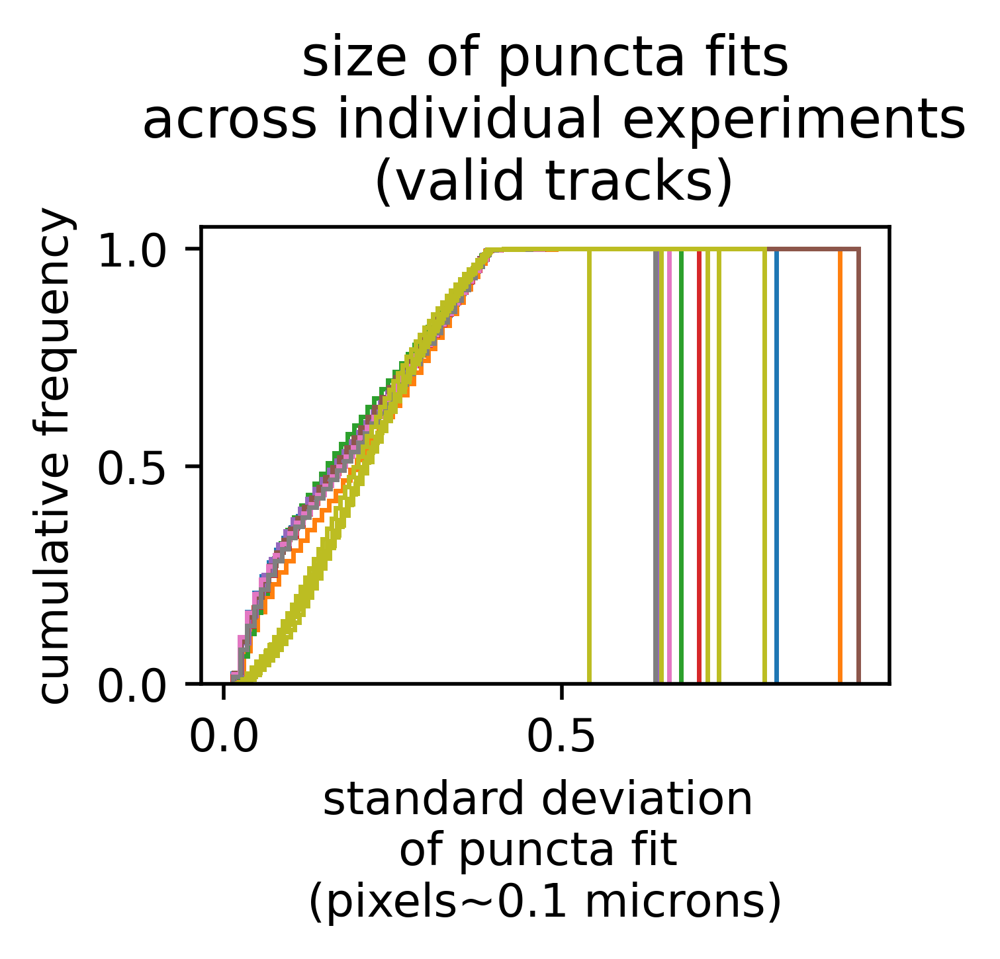

In [122]:
# %%capture
plt.figure(dpi=500, figsize=(3,3))
for i in range(13):
    plt.hist(x_std[i], cumulative=True, density=True, histtype='step', bins='auto', color=colors[i])
    
plt.xlabel('standard deviation \nof puncta fit \n(pixels~0.1 microns)')
plt.ylabel('cumulative frequency')
plt.title('size of puncta fits\n across individual experiments\n (valid tracks)')
plt.tight_layout()
# plt.savefig(unique_user_saved_outputs+'/plots/puncta_sizes.png')

In [123]:
# Image(filename=unique_user_saved_outputs+'/plots/puncta_sizes.png', height=500, width=500)

In [124]:
psf_counts = [[] for i in range(13)] # gather info on the status of the psf (non-psf, psf, or gaps are options for each time point)
fraction_psf = [[] for i in range(13)]

for j, track_set in enumerate(all_tracks):
    num_tracks_exp = len(track_set)    
    for i in range(len(track_set)):
        if track_set[i][index_dictionary['index_catIdx']][0][0]==1:
            psf_temp = track_set[i][index_dictionary['index_isPSF']][0]
            psf_counts[j].append(len(np.where(np.array(psf_temp)==1)[0]))
            fraction_psf[j].append(len(np.where(psf_temp==1)[0])/len(psf_temp))

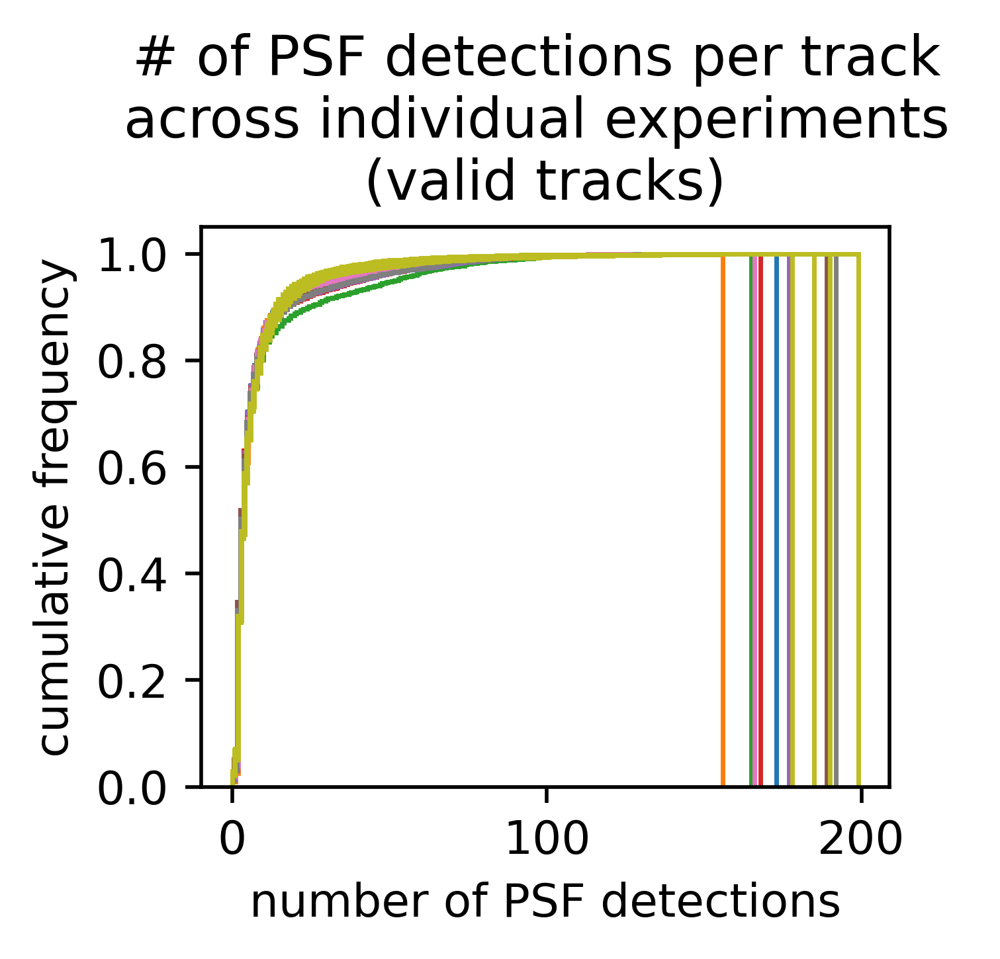

In [125]:
# %%capture
plt.figure(dpi=500, figsize=(3,3))
for i in range(13):
    plt.hist(psf_counts[i], cumulative=True, density=True, histtype='step', bins='auto', color=colors[i])
plt.xlabel('number of PSF detections')
plt.ylabel('cumulative frequency')
plt.title('# of PSF detections per track \nacross individual experiments \n(valid tracks)')
plt.tight_layout()
# plt.savefig(unique_user_saved_outputs+'/plots/psf_counts_per_track_per_exp.png')

In [126]:
# Image(filename=unique_user_saved_outputs+'/plots/psf_counts_per_track_per_exp.png', height=500, width=500)

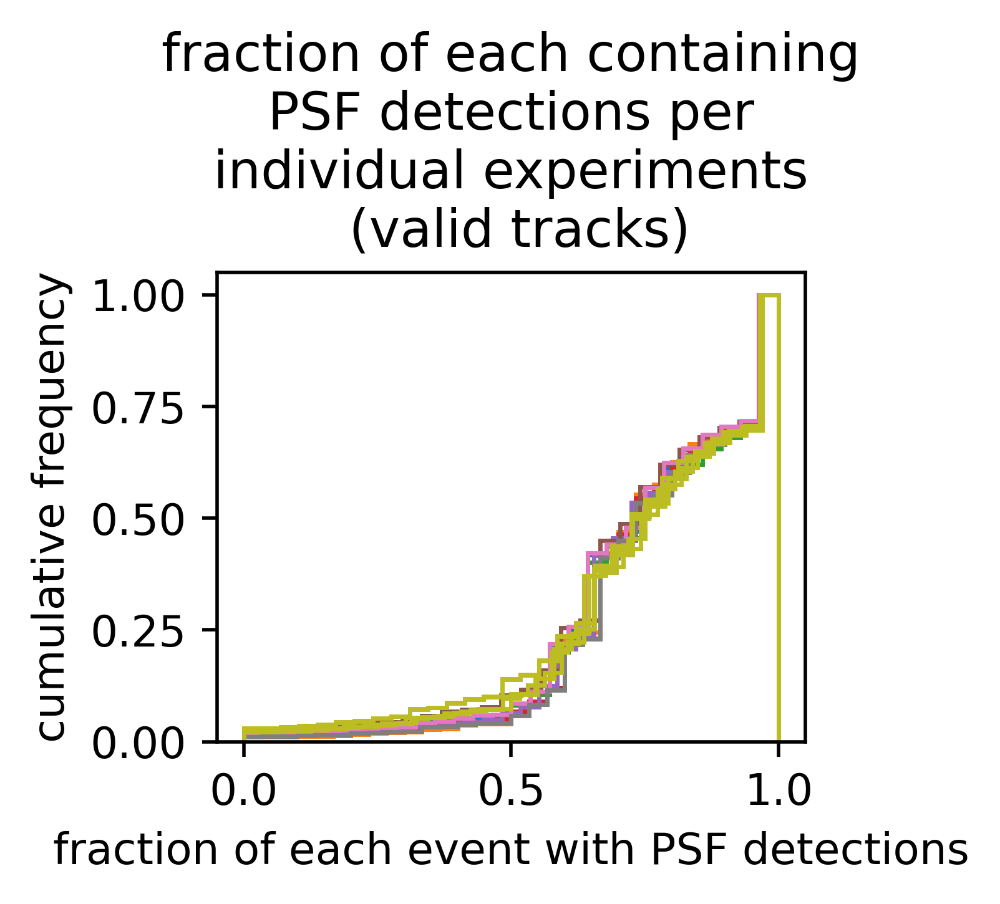

In [127]:
# %%capture
plt.figure(dpi=500, figsize=(3,3))
for i in range(13):
    plt.hist(fraction_psf[i], cumulative=True, density=True, histtype='step', bins='auto', color=colors[i])
plt.xlabel('fraction of each event with PSF detections')
plt.ylabel('cumulative frequency')
plt.title('fraction of each containing\n PSF detections per \nindividual experiments\n (valid tracks)')
plt.tight_layout()
# plt.savefig(unique_user_saved_outputs+'/plots/psf_fractions_per_track_per_exp.png')

In [120]:
# Image(filename=unique_user_saved_outputs+'/plots/psf_fractions_per_track_per_exp.png', height=500, width=500)

In [128]:
nonpsf_counts = [[] for i in range(13)] # calculate the fraction of each event that is a psf/non-psf fit
fraction_nonpsf = [[] for i in range(13)]
for j, track_set in enumerate(all_tracks):
    num_tracks_exp = len(track_set)
    for i in range(len(track_set)):
        if track_set[i][index_dictionary['index_catIdx']][0][0]==1:
            psf_temp = track_set[i][index_dictionary['index_isPSF']][0]
            nonpsf_counts[j].append(len(np.where(psf_temp==0)[0]))
            fraction_nonpsf[j].append(len(np.where(psf_temp==0)[0])/len(psf_temp))

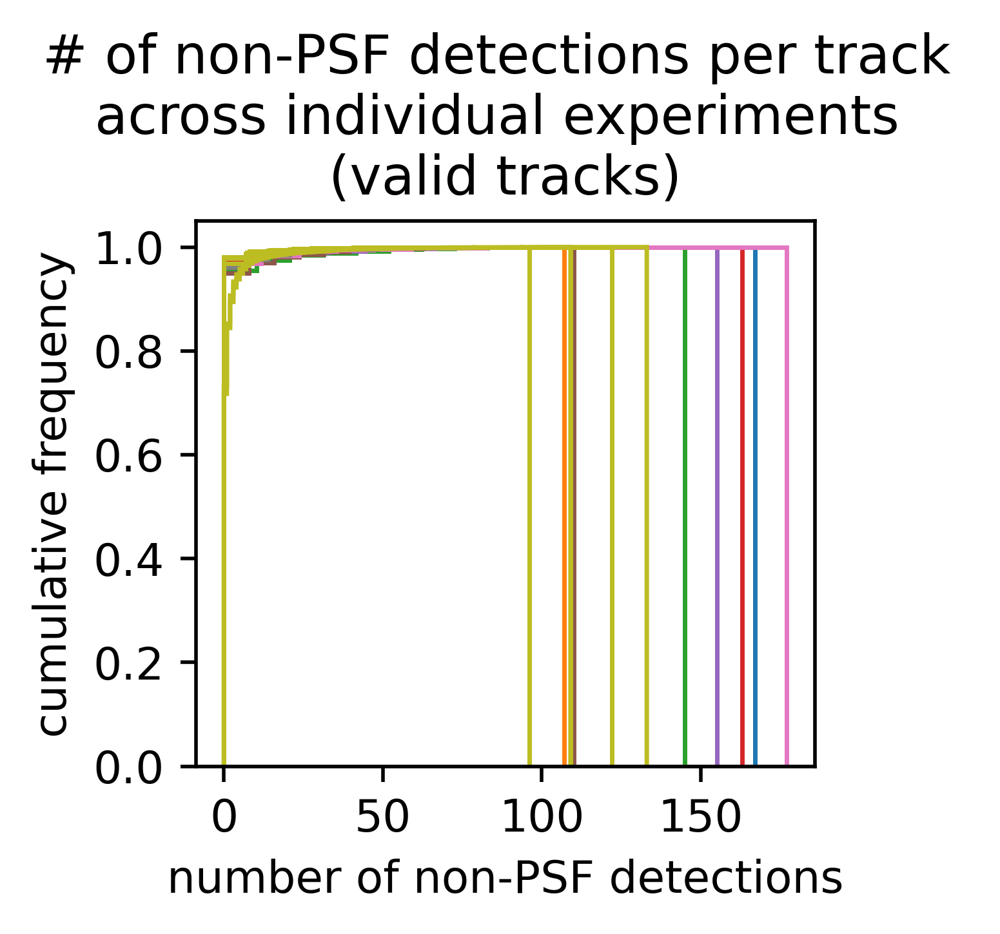

In [129]:
# %%capture
plt.figure(dpi=500, figsize=(3,3))
for i in range(13):
    plt.hist(nonpsf_counts[i], cumulative=True, density=True, histtype='step', bins='auto', color=colors[i])
plt.xlabel('number of non-PSF detections')
plt.ylabel('cumulative frequency')
plt.title('# of non-PSF detections per track \nacross individual experiments \n(valid tracks)')
plt.tight_layout()
# plt.savefig(unique_user_saved_outputs+'/plots/nonpsf_counts_per_track_per_exp.png')

In [130]:
# Image(filename=unique_user_saved_outputs+'/plots/nonpsf_counts_per_track_per_exp.png', height=500, width=500)

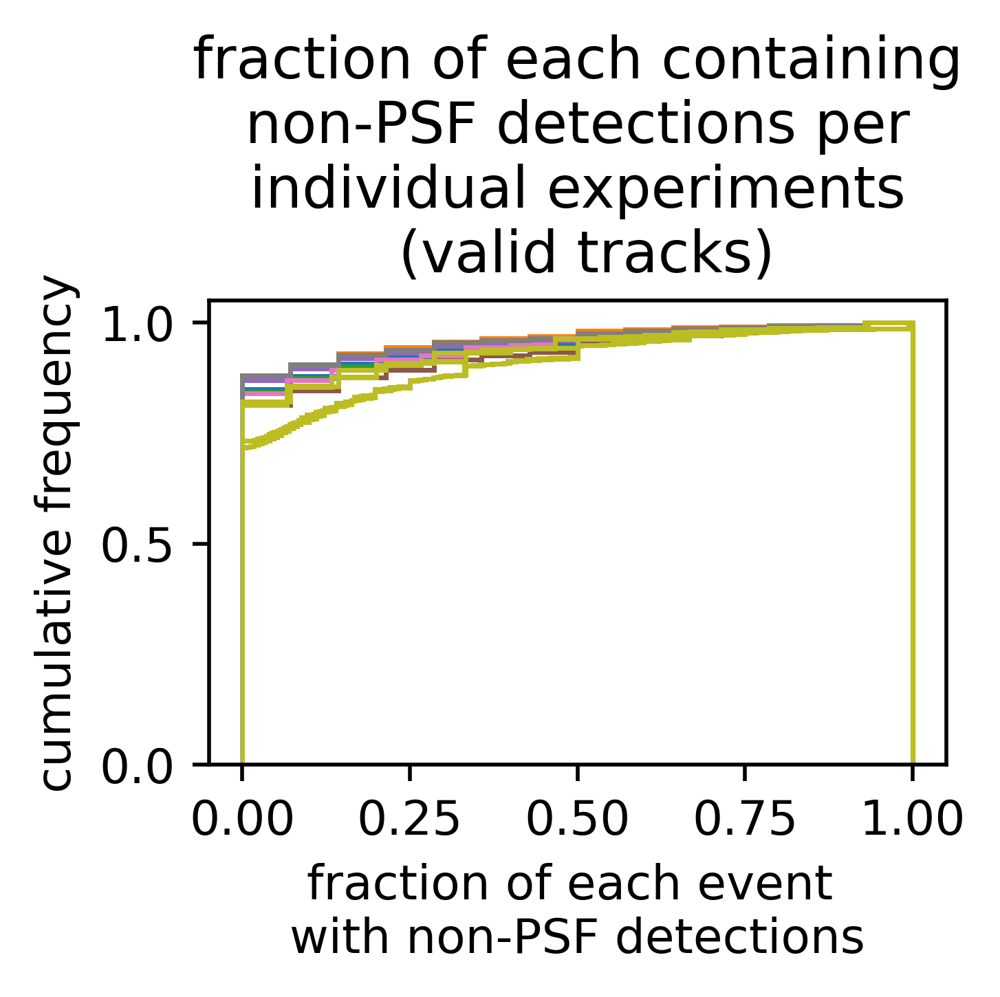

In [131]:
# %%capture
plt.figure(dpi=500, figsize=(3,3))
for i in range(13):
    plt.hist(fraction_nonpsf[i], cumulative=True, density=True, histtype='step', bins='auto', color=colors[i])
plt.xlabel('fraction of each event \nwith non-PSF detections')
plt.ylabel('cumulative frequency')
plt.title('fraction of each containing\n non-PSF detections per \nindividual experiments\n (valid tracks)')
plt.tight_layout()
# plt.savefig(unique_user_saved_outputs+'/plots/nonpsf_fractions_per_track_per_exp.png')

In [ ]:
# Image(filename=unique_user_saved_outputs+'/plots/nonpsf_fractions_per_track_per_exp.png', height=500, width=500)